## Session 8

### Debugging And Troubleshooting Walkthrough for Apache Spark
This guide walks you through the different debugging options available to peek at the internals of your Apache Spark application.We will take a look in how to debugg and troubleshoot using spark webui and what are the issues while running spark applications.We will cover following sections:
- 4-1. Debugging and troubleshooting, tools and methods
- 4-2. Reducing Reads with Built-In Optimizers
- 4-3. Issues with Spark Shuffle
- 4-4. Data Skew, Demonstration, and Remediation
- 4-5. User Defined Functions (UDFs) and broadcasting

#### 4-1. Debugging and troubleshooting, tools and methods
Spark UI for troubleshooting
- When any Spark job or application fails, you should identify the errors and exceptions that cause the failure. You can access the Spark logs to identify errors and exceptions.
- Spark Debugging Tools:
  - Spark UI
    - Once you start the job, the Spark UI shows information about what’s happening in your application.Default 
      Spark Webui is localhost:4040
    - Initially,spark ui has Jobs,Stages,Storage,Environment,Executors taps to view.Once you execute sql queries,spark streaming applications,SQL/Dataframe,Spark Streaming taps will enable to see the query performance.
    - We can see the status of job whether completed,running or failed.Also we can check logs of particular jobs by navigating on each stages ang clicking on std
  - Driver logs
    - Driver logs are helpful for 2 purposes:

      - Exceptions: 
         - To look at the stack trace of the exception. 
         - To understand on the nature of the underlying issues.

      - Prints: Any print statements as part of the DAG shows up in the logs too.
    - You will find driver logs in executors tab by clicking on stdout/stderr as shown in below screen shots.

  - Executor logs
    - Executor logs are sometimes helpful if you see certain tasks are misbehaving and would like to see the logs for specific tasks.


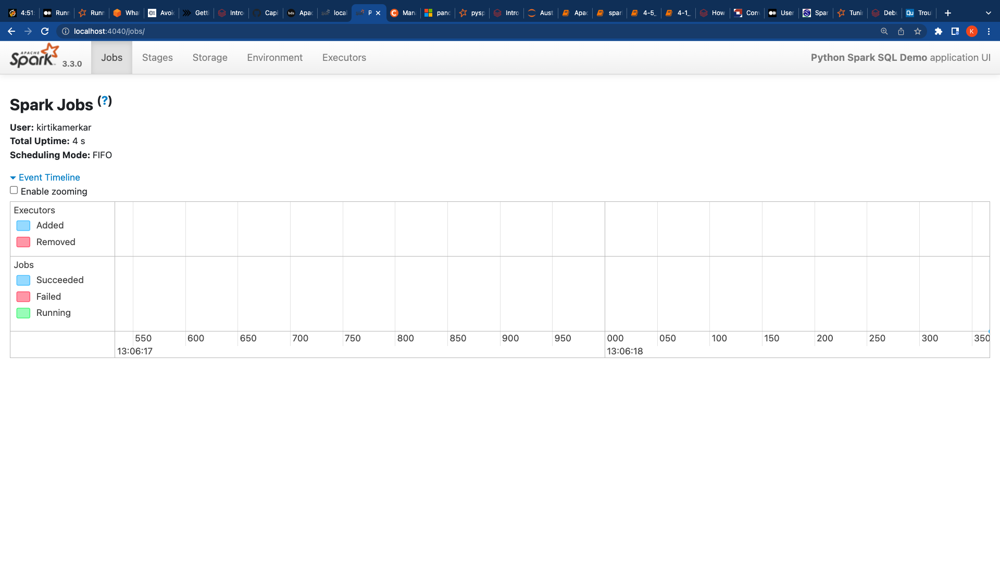

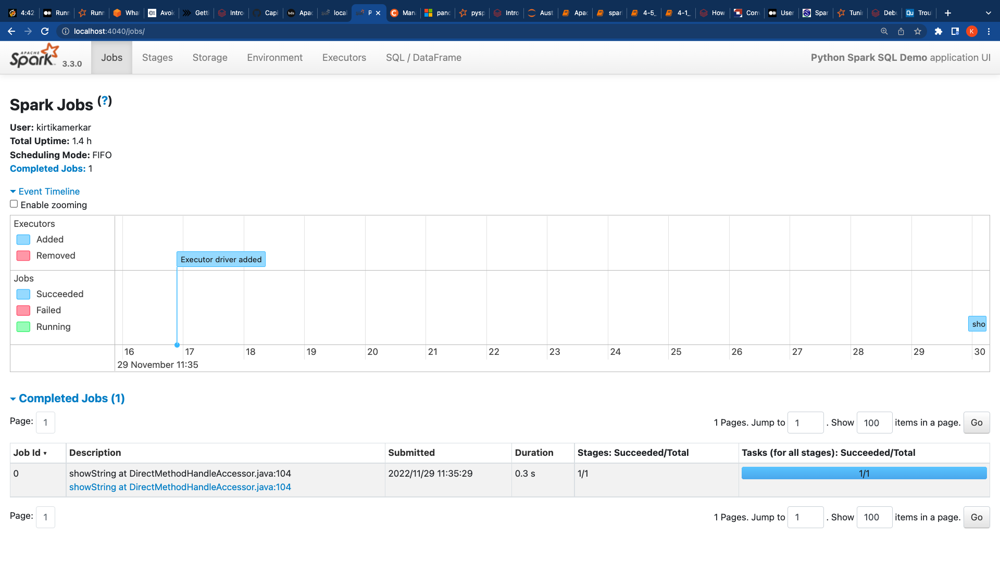

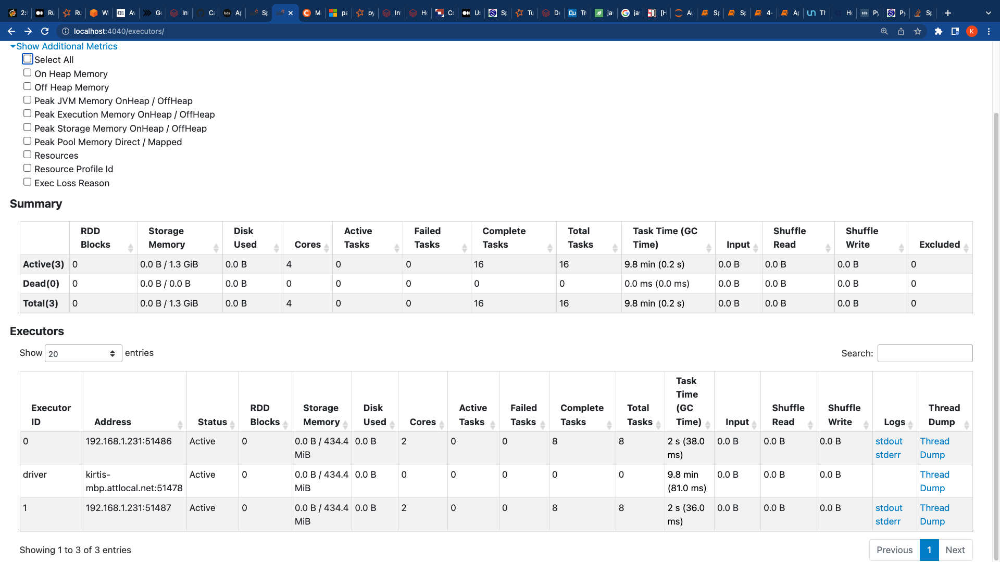

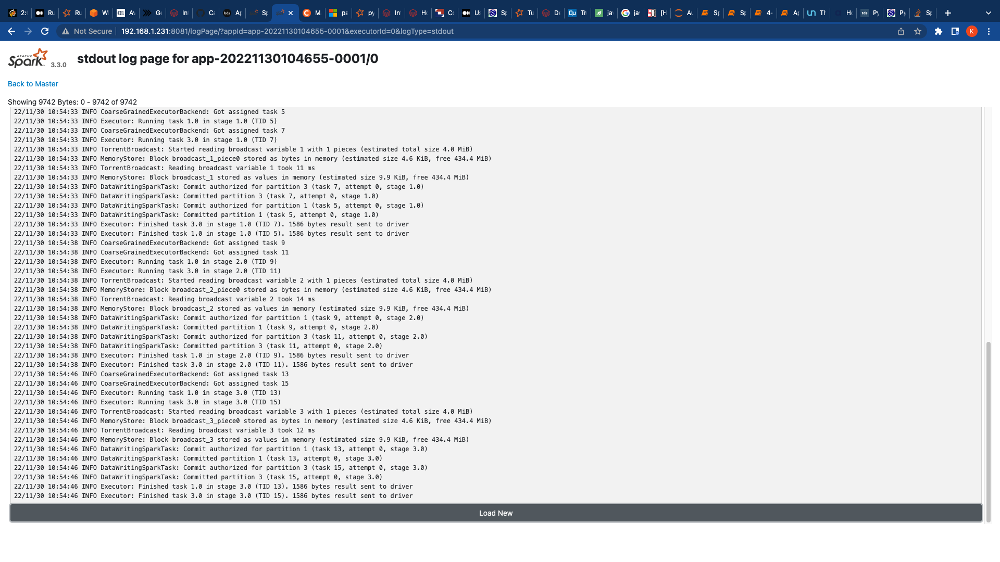

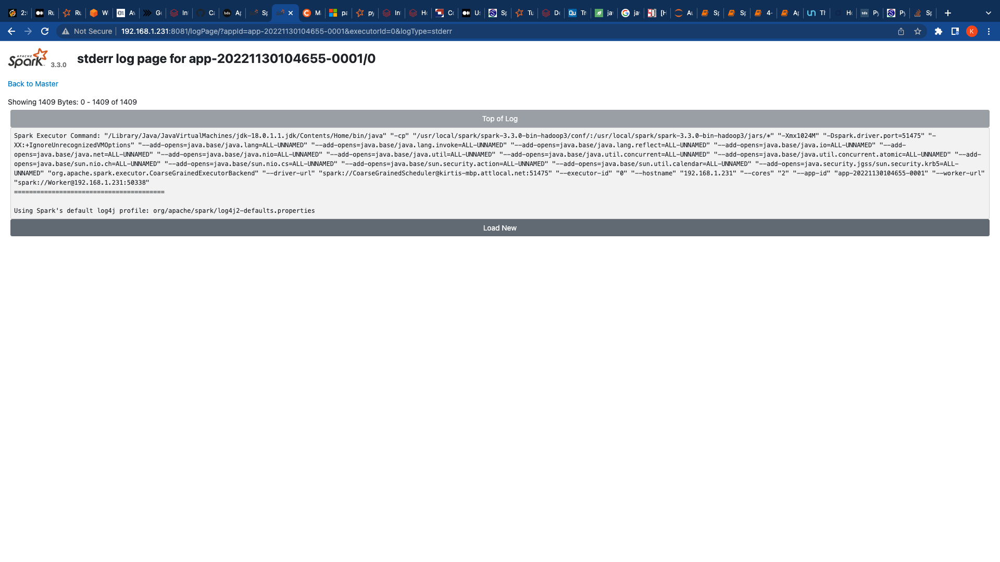

- A thread dump is a snapshot of everything that an application is doing right at the instance it's taken. If an application log is a diary of a vacation, a thread dump is a photo. 
- It is a collection of stack traces, one for each thread that's running in the instance. 

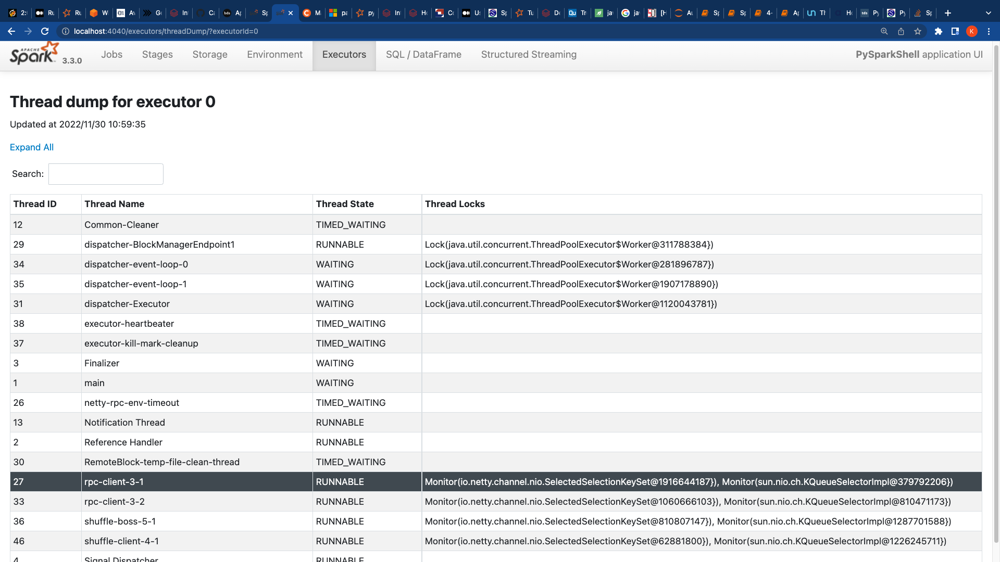

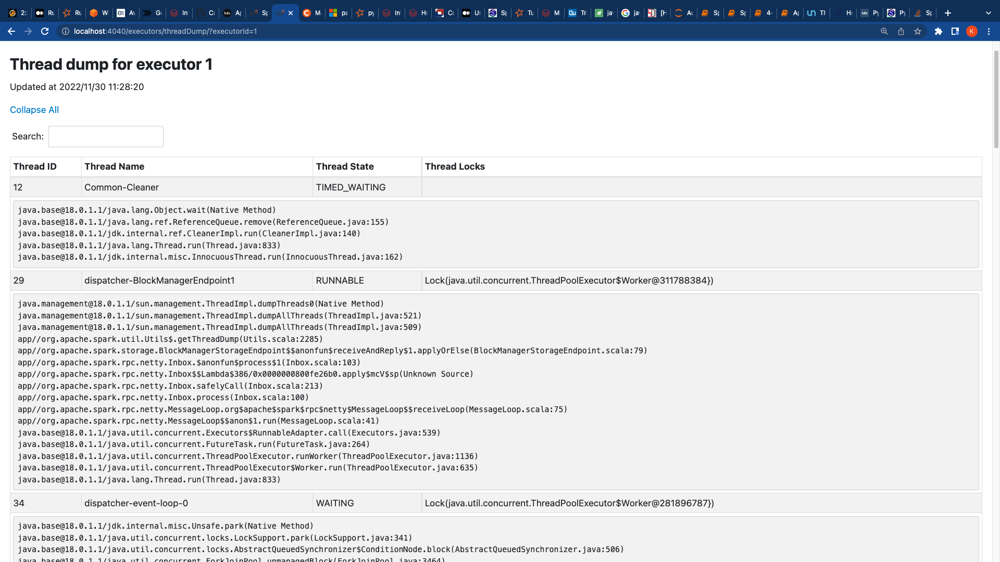

#### Spark directed acyclic graph (DAG):
 - DAG or Directed Acyclic Graph is defined as a set of the Vertices and the edges where the vertices represent Resilient distributed systems(RDD), and edges represent the Operation which is to be applied on RDD.
 - Every edge directs from the earlier to later in sequence; thus, on calling of action, the previously created DAGs submits to the DAG Scheduler, which further splits a graph into stages of the task. 
 - It is the strict generalization of the MapReduce model. 
 - The DAG operations can do better global optimization than the other systems like MapReduce.It allows a user to dive into the stage and further expand on detail on any stage.

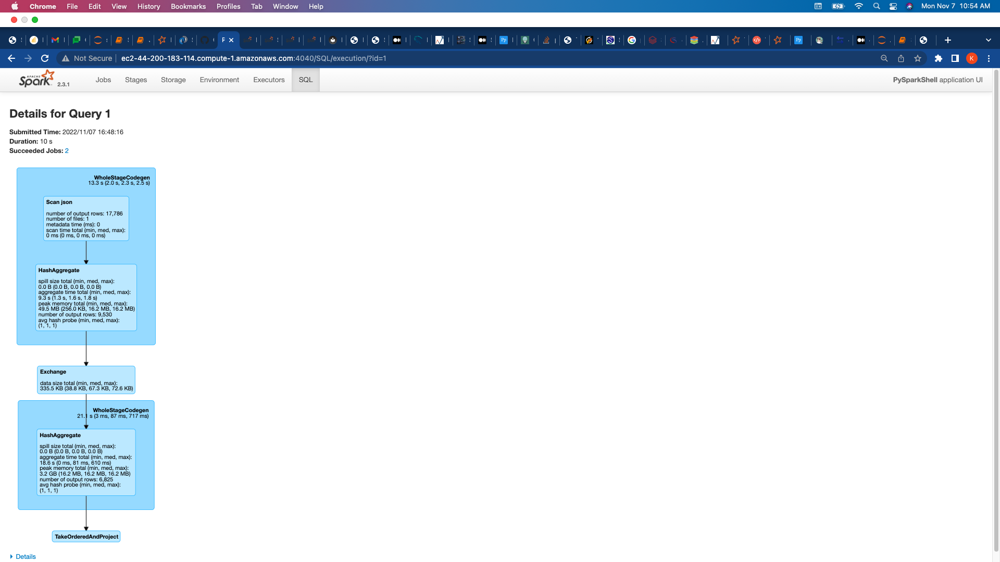

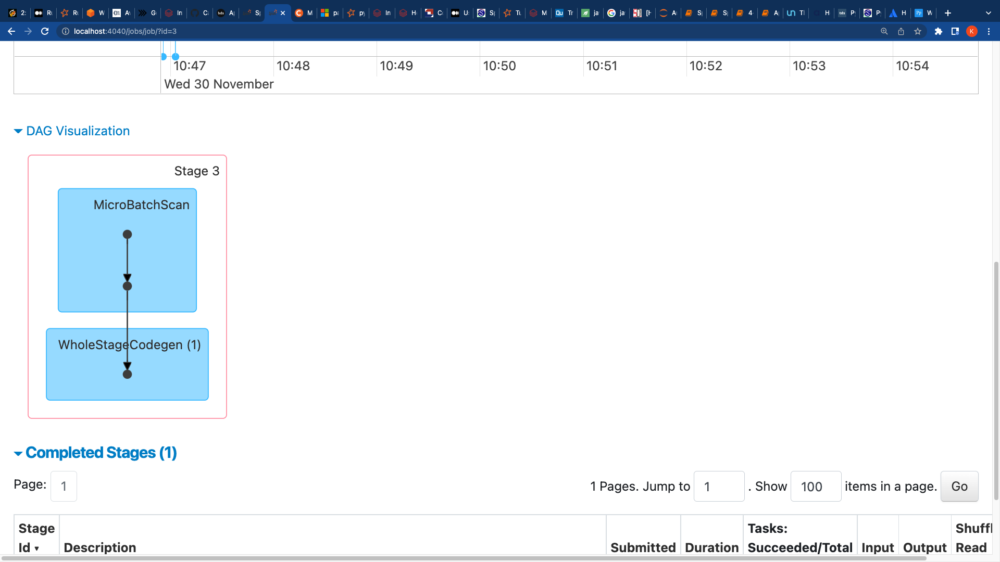

#### Spark Troubleshooting:
- #### Errors and exceptions when running Spark jobs or applications
   - Out of Memory Exceptions
     -  When troubleshooting the out of memory exceptions, you should understand how much memory and cores the application requires, and these are the essential parameters for optimizing the Spark appication. Based on the resource requirements, you can modify the Spark application parameters to resolve the out-of-memory exceptions.
     - Driver memory exception 
       - Exception due to Spark driver running out of memory
       - Job failure because the Application Master that launches the driver exceeds memory limits
     - Executor Memory Exceptions 
       - Exception because executor runs out of memory
       - FetchFailedException due to executor running out of memory
       - Executor container killed by YARN for exceeding memory limits
   - Spark job repeatedly fails
   - FileAlreadyExistsException in Spark jobs
   - Spark Shell Command failure
   - Error when the total size of results is greater than the Spark Driver Max Result Size value
   - Too Large Frame error
   - Spark jobs fail because of compilation failures
   - Spark job fails with throttling in S3 when using MFOC (AWS)

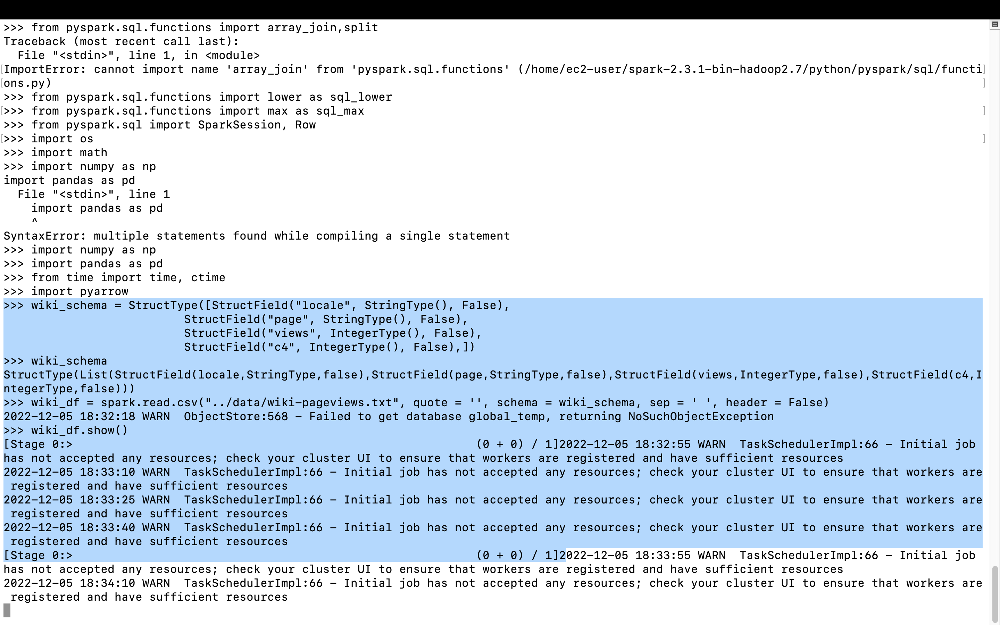

- #### Cluster analytics, resource allocation
- #### Examples analyzing problem cases



##### Resource Allocation  for 3 Workers with two cores and 1 Master Node 

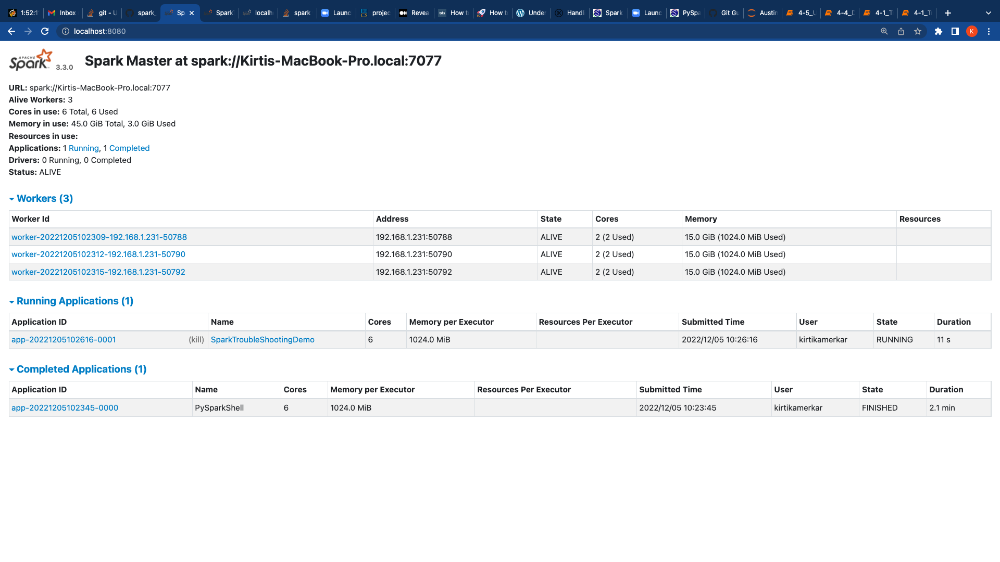

### 4-2. Reducing Reads with Built-In Optimizers:
- Schema provision
- Projection pushdown
- Filter pushdown
- Demonstration and exercise
##### Overview
  - To improve query performance, one strategy is to reduce the amount of data that is transferred from the data storage to these executors.We will examine how does pushdown filter help to reduce reads with Built_In optimizer.
##### Task
 - You've already worked with the data file (data/wiki-pageviews.txt). In previous labs you should already have done the below.
 - Filter the "views" field from "wikiPage" dataframe with predicate pushdown(pushdown filter) and projection pushdown(selection pushdown) filter.
 - Observe the performance using spark WebUI and using explain()method.
 - Repeat the same but changing the cast of the views using "df.withColumn(col("views").cast(StringType())" or any method to change the cast of column."df.select(col("view").cast(StringType())"
 - Observe the performance. 

##### Setup:
We're going to look at a few examples to discuss their actual performance and use cases where they're helpful. For these exercises, we'll use the wiki-pageviews.txt dataset.


##### Imports:

In [32]:
#Reduced read due to optimized builts
#A shuffle join problem demonstration
# The issue with repeated values and nulls
# DataSkew
# Alternative upstream aggregation
#Demonstration and exercise
import pyspark
from pyspark import SparkContext, SparkConf
from pyspark.sql.types import *
from pyspark.sql.functions import avg, col, count, collect_list, explode, lit, rand, struct,array,monotonically_increasing_id
from pyspark.sql.functions import udf, pandas_udf, PandasUDFType
from pyspark.sql.functions import array_join,  split

from pyspark.sql.functions import lower as sql_lower
from pyspark.sql.functions import max as sql_max
from pyspark.sql.functions import min as sql_min
from pyspark.sql.functions import log as sql_log
from pyspark.sql.functions import mean as sql_mean

from pyspark.sql import SparkSession, Row

import os

import math
import numpy as np
import pandas as pd

from time import time, ctime

import pyarrow # only needed to print the version of this 'under the hood' component

In [4]:
conf=SparkConf()
sc=SparkContext(conf=conf)

# Stop default sc
sc.stop()
# Create sparkContext object
## Create Spark Session
spark = SparkSession \
    .builder \
    .master("spark://Kirtis-MBP.attlocal.net:7077") \
    .appName("SparkTroubleShootingDemo") \
    .config("spark.executor.memory",'2g') \
    .getOrCreate()


#sc=SparkContext(conf=conf)#sc.stop()
#spark.stop()




Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


23/01/05 12:08:12 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [10]:
spark

In [11]:
## Version Information
print("Spark", spark.version)
print("Hadoop",spark.sparkContext._jvm.org.apache.hadoop.util.VersionInfo.getVersion())
print()

! python --version
print("PyArrow",pyarrow.__version__)
print("Pandas",pd.__version__)
print("NumPy",np.__version__)
print()

! java -version

Spark 3.3.0
Hadoop 3.3.2

Python 3.9.7
PyArrow 10.0.1
Pandas 1.4.2
NumPy 1.21.5

java version "18.0.1.1" 2022-04-22
Java(TM) SE Runtime Environment (build 18.0.1.1+2-6)
Java HotSpot(TM) 64-Bit Server VM (build 18.0.1.1+2-6, mixed mode, sharing)


##### Read the data in
- Let's get the data into our notebook. We're working with the wikipedia page views set (spark-labs-python/data/wiki-pageviews.txt).
- ../moredata/WDI_world.pop.csv
- ../moredata/WDI_world.gdp.csv
- ../moredata/countries-languages.csv

##### Set the working directory:
Verify that we can access our data set.

You may need to change data_path below

In [15]:
## Verify that we are accessing the data file

#data_folder = "../spark-labs-python/data"
data_folder = "../moredata"
data_path = data_folder + "/wiki-pageviews.txt"

print(f"The file at `{data_path}` {'exists' if os.path.isfile(data_path) else 'does NOT exist! Check your path'}.")

The file at `../moredata/wiki-pageviews.txt` exists.


##### Read in the data:
We're reading the data in from text. There are a few things to note in the read:

- We are defining the schema.
- It's best practice and it will result in faster reads.
- The types are defined in the spark documentation.
- We imported all the types with the from pyspark.sql.types import * command.
- We define the separator ourselves since this file is actually space separated, not comma separated.
- We supply an explicit argument to quote.
- The default argument is '"'.
- When we actually dig into the data we see that some languages have an article named ".
- These articles cause the parser to read in the page views and column 4 as part of the page name.
- Spark counts the page views for these articles as null even though there's data there.
- It's important to do data quality checks always, but especially when dealing with text data.
- You will end up destroying data if you're not careful.

In [16]:
## Define Schema for wiki data
wiki_schema = StructType([StructField("locale", StringType(), False),
                          StructField("page", StringType(), False),
                          StructField("views", IntegerType(), False),
                          StructField("c4", IntegerType(), False),])

## Read in data
  ## Note there are pages which are just '"' we need to include empty string as the 'quote' argument so that they get read in correctly.
wiki_df = spark.read.csv("../moredata/wiki-pageviews.txt", quote = '', schema = wiki_schema, sep = ' ', header = False)


In [17]:
# load the WDI data and language data
WDIpop_df = spark.read.csv("../moredata/WDI_world.pop.csv", sep = ',', header = True)

WDIgdp_df = spark.read.csv("../moredata/WDI_world.gdp.csv", sep = ',', header = True)

lang_df = spark.read.csv("../moredata/countries-languages.csv", sep = ',', header = True)


In [18]:
# look at the data
wiki_df.dtypes
wiki_df.sort('views', ascending = False).show(10)


+------+--------------------+------+---+
|locale|                page| views| c4|
+------+--------------------+------+---+
|  en.m|           Main_Page|386425|  0|
|    en|           Main_Page|248511|  0|
|  de.m|Wikipedia:Hauptseite| 92347|  0|
|  it.m|      Imma_Battaglia| 89964|  0|
|    en|      Special:Search| 69630|  0|
|  fr.m|Wikipédia:Accueil...| 60361|  0|
|    en|                Rice| 47233|  0|
|  it.m|   Pagina_principale| 38624|  0|
|    en|             404.php| 34859|  0|
|  es.m|   Wikipedia:Portada| 34792|  0|
+------+--------------------+------+---+
only showing top 10 rows



##### Reduced Read Exercise with demostration:
Filter the data with and without select option and explain() to check its performance.

In [19]:
wiki_df.select("page","views").filter(wiki_df.views >= 5000).explain()

== Physical Plan ==
*(1) Filter (isnotnull(views#2) AND (views#2 >= 5000))
+- FileScan csv [page#1,views#2] Batched: false, DataFilters: [isnotnull(views#2), (views#2 >= 5000)], Format: CSV, Location: InMemoryFileIndex(1 paths)[file:/Users/kirtikamerkar/Austincapitaldata/spark_curriculum/moredata/..., PartitionFilters: [], PushedFilters: [IsNotNull(views), GreaterThanOrEqual(views,5000)], ReadSchema: struct<page:string,views:int>




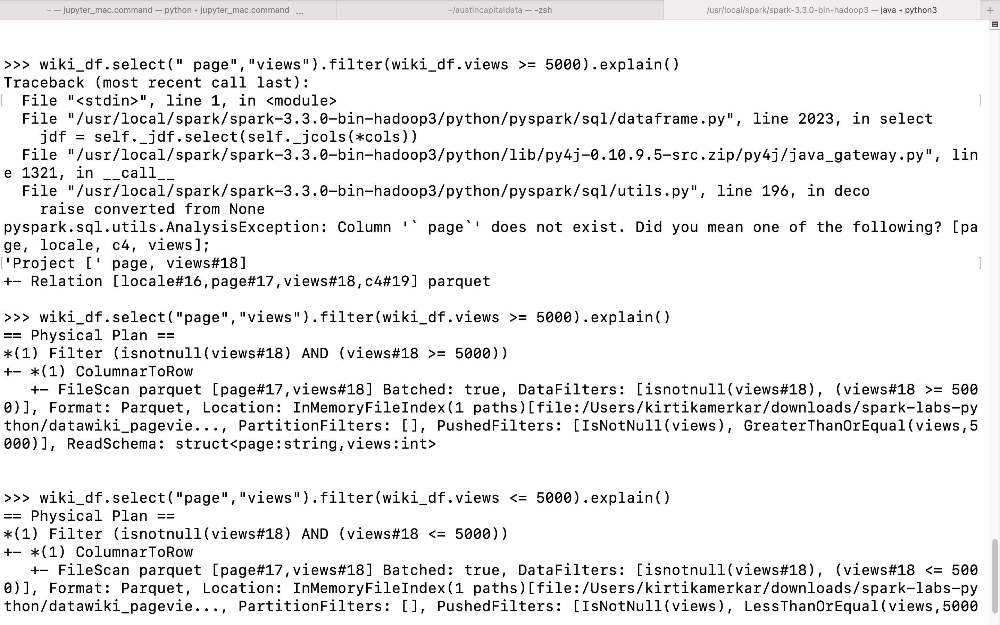

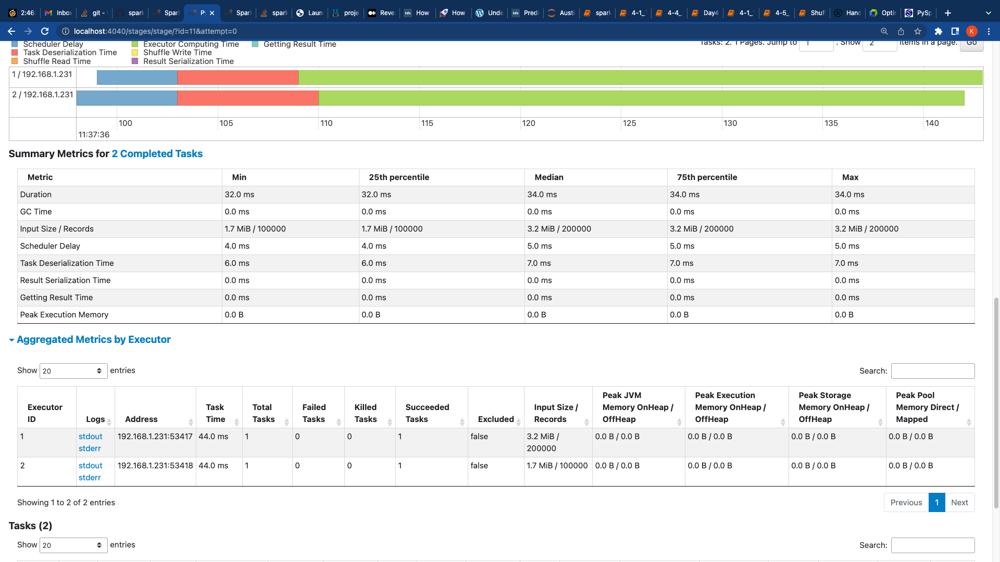

viewWithSchemaDf=wiki_df.withColumn("locale",col("locale").cast(StringType())).withColumn("page",col("page").cast(StringType())).withColumn("views",col("views").cast(StringType())).withColumn("c4",col("c4").cast(LongType()))
viewWithSchemaDf.printSchema()

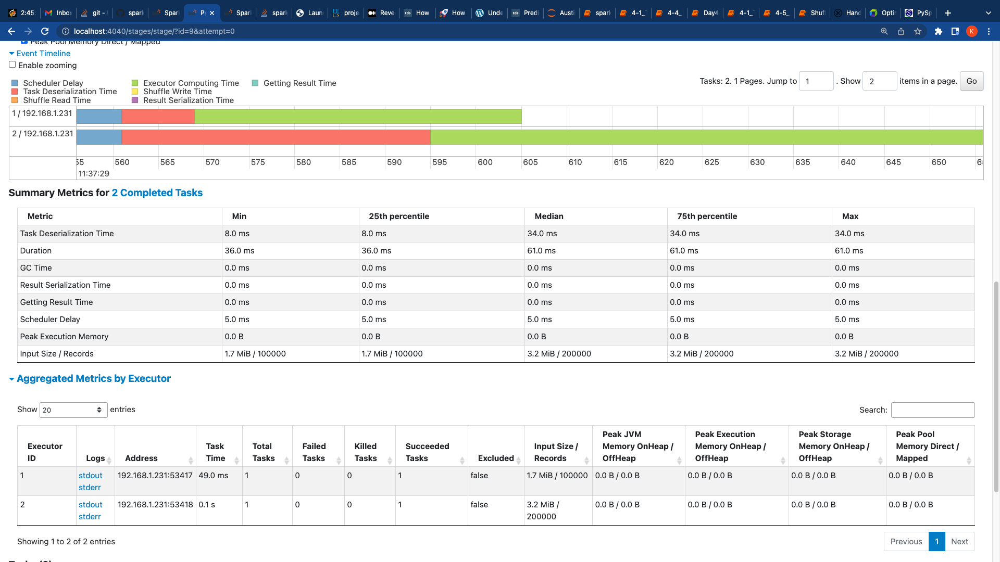

##### Summary:
 - Filter pushdown and selection pushdown are two techniques that can greatly improve the performance of queries. While many of the standard technologies (such as the Spark readers for CSV files or parquet files) already implement these strategies, we still have to implement the handling, for example, when implementing our custom database connector or a specific data structure. Also keep in mind that not every filter operation is pushed down to the data source and small changes, for example in the schema of the dataset, might have a huge performance impact.

#### 4-3. Issues with Spark Shuffle:
 Shuffling is the process of exchanging data between partitions.Shuffling is occured due to the use of gruopBy(),groupByKey(),join() operations.
Shuffling is commonly integrated as part of the Reduce phase, even though it really has little to do with the
semantics of the data
The entire working set, which is usually a large fraction of the
input data, must be transferred across the network. This
places significant burden on the OS on both the source and
the destination by requiring many file and network I/Os.Following are the issues created by shuffling.
- A time-consuming operation
- If one worker node receives more data than any other worker,you will have to wait for that worker to finish processing while others do nothing.
- During wait process ,the worker may fail, and the cluster will need to repeat a part of the computation.


##### Exercise and Demostration for shuffling issues:
- Use gruopBy and join operation.
- Use complex joins with inner and outer join.Use count() and examine the performance.

In [11]:
WDIpop_df.printSchema()

root
 |-- Country Name: string (nullable = true)
 |-- Country Code: string (nullable = true)
 |-- Indicator Name: string (nullable = true)
 |-- Indicator Code: string (nullable = true)
 |-- 1960: string (nullable = true)
 |-- 1961: string (nullable = true)
 |-- 1962: string (nullable = true)
 |-- 1963: string (nullable = true)
 |-- 1964: string (nullable = true)
 |-- 1965: string (nullable = true)
 |-- 1966: string (nullable = true)
 |-- 1967: string (nullable = true)
 |-- 1968: string (nullable = true)
 |-- 1969: string (nullable = true)
 |-- 1970: string (nullable = true)
 |-- 1971: string (nullable = true)
 |-- 1972: string (nullable = true)
 |-- 1973: string (nullable = true)
 |-- 1974: string (nullable = true)
 |-- 1975: string (nullable = true)
 |-- 1976: string (nullable = true)
 |-- 1977: string (nullable = true)
 |-- 1978: string (nullable = true)
 |-- 1979: string (nullable = true)
 |-- 1980: string (nullable = true)
 |-- 1981: string (nullable = true)
 |-- 1982: string (null

In [12]:
WDIgdp_df.printSchema()

root
 |-- Country Name: string (nullable = true)
 |-- Country Code: string (nullable = true)
 |-- Indicator Name: string (nullable = true)
 |-- Indicator Code: string (nullable = true)
 |-- 1960: string (nullable = true)
 |-- 1961: string (nullable = true)
 |-- 1962: string (nullable = true)
 |-- 1963: string (nullable = true)
 |-- 1964: string (nullable = true)
 |-- 1965: string (nullable = true)
 |-- 1966: string (nullable = true)
 |-- 1967: string (nullable = true)
 |-- 1968: string (nullable = true)
 |-- 1969: string (nullable = true)
 |-- 1970: string (nullable = true)
 |-- 1971: string (nullable = true)
 |-- 1972: string (nullable = true)
 |-- 1973: string (nullable = true)
 |-- 1974: string (nullable = true)
 |-- 1975: string (nullable = true)
 |-- 1976: string (nullable = true)
 |-- 1977: string (nullable = true)
 |-- 1978: string (nullable = true)
 |-- 1979: string (nullable = true)
 |-- 1980: string (nullable = true)
 |-- 1981: string (nullable = true)
 |-- 1982: string (null

In [13]:
lang_df.printSchema()

root
 |-- Country: string (nullable = true)
 |-- Languages Spoken: string (nullable = true)



In [9]:
wiki_df.count()

5709055

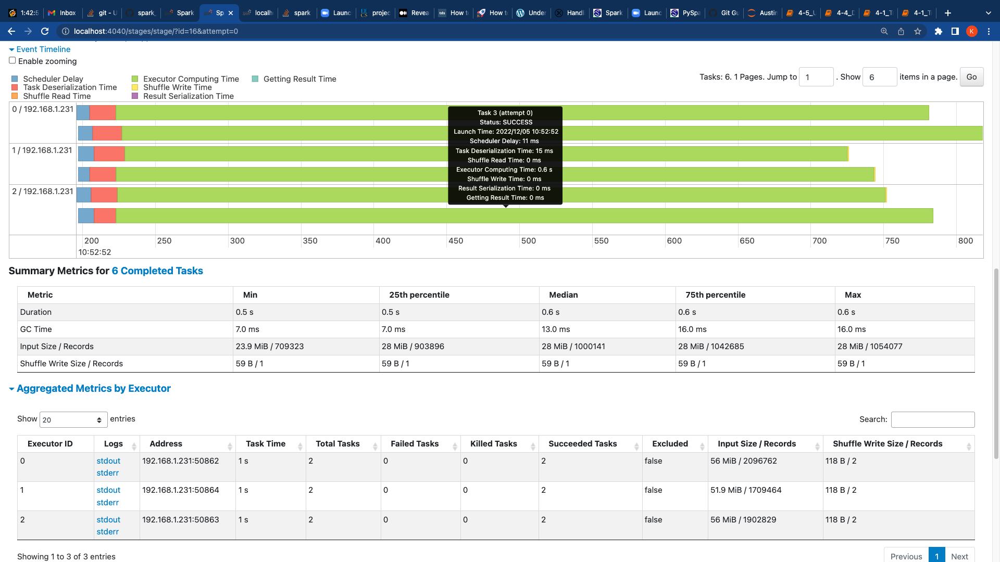

In [10]:
wiki_df.select('*').filter(wiki_df.locale == "en").sort('views', ascending = False).count()

1294927

In [11]:
### spark SQL queries
wiki_df.createOrReplaceTempView("WIKI")
wiki_df.show(3)
spark.sql("SELECT locale, avg(views) FROM WIKI GROUP BY locale").show()

+------+---------+-----+---+
|locale|     page|views| c4|
+------+---------+-----+---+
|    aa|Main_Page|    3|  0|
|    aa|Main_page|    1|  0|
|    aa|User:Savh|    1|  0|
+------+---------+-----+---+
only showing top 3 rows



+---------+------------------+
|   locale|        avg(views)|
+---------+------------------+
|  cbk-zam|               2.0|
|    als.m|2.0961538461538463|
|  de.zero|1.3873873873873874|
|    diq.m|1.3333333333333333|
|     cs.n|1.9230769230769231|
|       en|   4.3922645832545|
|  az.zero|         1.5703125|
| beta.m.v|              1.08|
|ar.zero.b|1.4285714285714286|
| arc.zero|               2.0|
|       cr|               1.6|
|de.zero.v|               1.0|
|  bh.zero|               1.0|
|  da.zero|               1.1|
|ar.zero.s|1.5286624203821657|
|bat-smg.m|               1.0|
|      crh|1.4366197183098592|
|    ast.q|               1.0|
|   de.m.d| 1.488909008601177|
|ar.zero.n|1.3571428571428572|
+---------+------------------+
only showing top 20 rows



In [12]:
spark.sql("SELECT locale, avg(views) FROM WIKI GROUP BY locale").count()

1595

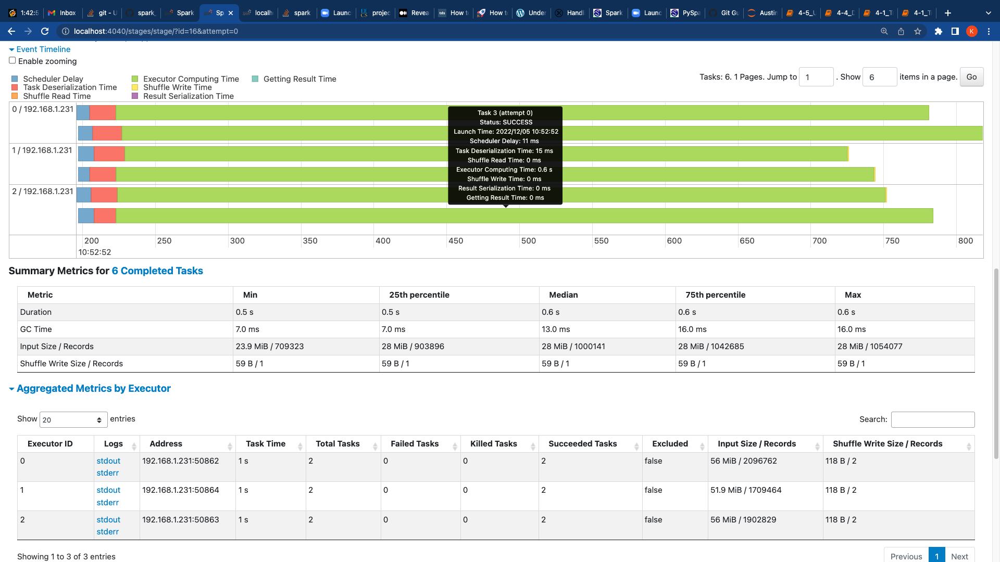

###### Shuffling occured with  each stage 

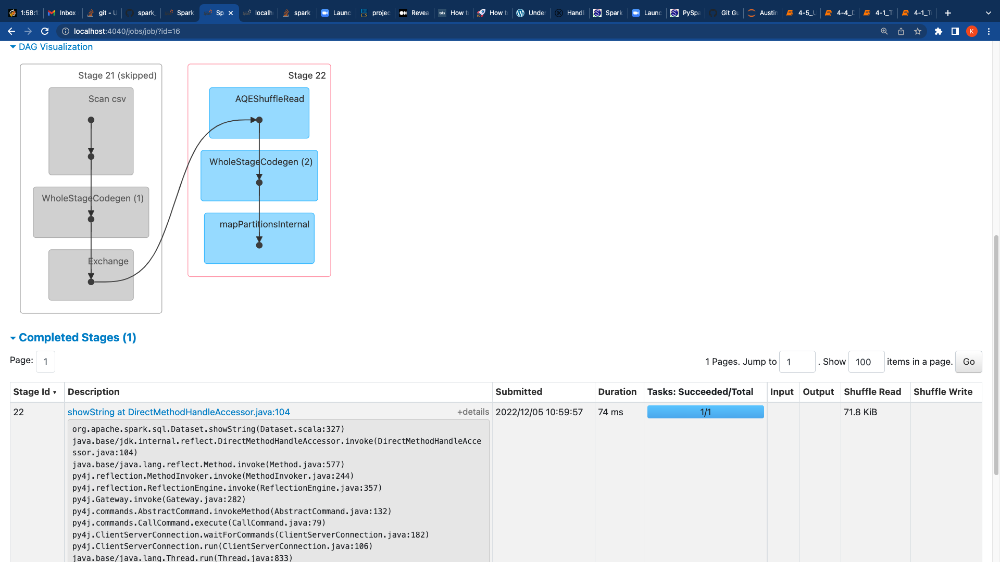

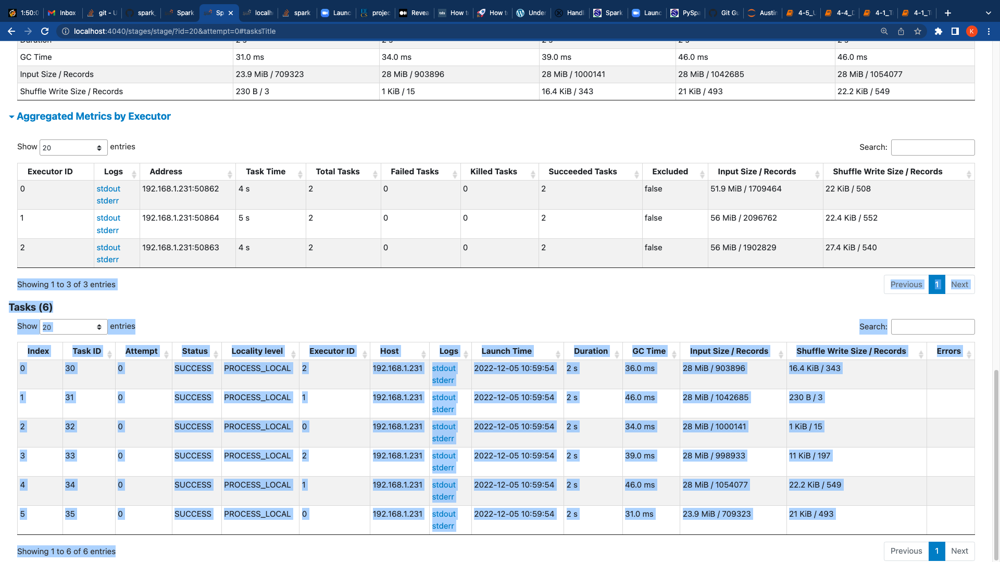

In [15]:
# Lot of Shuffling occur with execution time 27ms
spark.sql("SELECT locale, avg(views) FROM WIKI GROUP BY locale").count()


1595

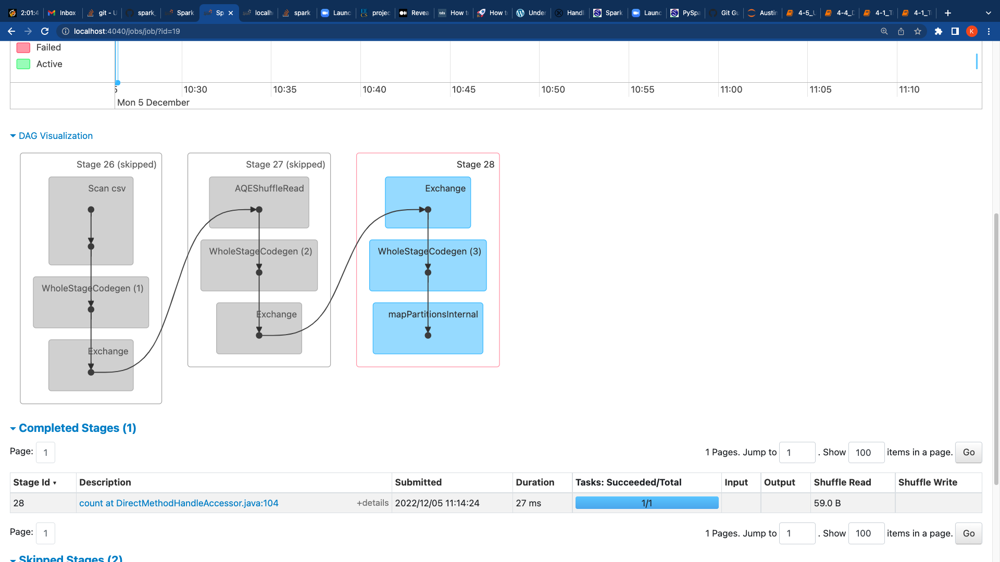

In [20]:
from pyspark.sql.functions import split, col, substring, regexp_replace, countDistinct
from pyspark.sql import functions as f

from pyspark.sql.types import *
from pyspark.sql import *
# use the pysparksql split to split 
split_col = split_col = f.split(wiki_df.locale, '\.')


In [21]:
wiki_dom = wiki_df.withColumn('Domain', split_col.getItem(0)) \
       .withColumn('project', split_col.getItem(1)) \
       .withColumn('project2', split_col.getItem(2))
wiki_dom.show(40, truncate=False)

+------+--------------------------+-----+---+------+-------+--------+
|locale|page                      |views|c4 |Domain|project|project2|
+------+--------------------------+-----+---+------+-------+--------+
|aa    |Main_Page                 |3    |0  |aa    |null   |null    |
|aa    |Main_page                 |1    |0  |aa    |null   |null    |
|aa    |User:Savh                 |1    |0  |aa    |null   |null    |
|aa    |Wikipedia                 |1    |0  |aa    |null   |null    |
|aa.b  |User:Savh                 |1    |0  |aa    |b      |null    |
|aa.d  |User:Savh                 |1    |0  |aa    |d      |null    |
|ab    |1986                      |1    |0  |ab    |null   |null    |
|ab    |B                         |1    |0  |ab    |null   |null    |
|ab    |Авикипедиа                |1    |0  |ab    |null   |null    |
|ab    |Авикипедиа:Vital_articles |1    |0  |ab    |null   |null    |
|ab    |Авикипедиа:Описание       |1    |0  |ab    |null   |null    |
|ab    |Ала         

In [22]:
wiki_dom.createOrReplaceTempView("WIKI")
wiki_dom.show(3)


+------+---------+-----+---+------+-------+--------+
|locale|     page|views| c4|Domain|project|project2|
+------+---------+-----+---+------+-------+--------+
|    aa|Main_Page|    3|  0|    aa|   null|    null|
|    aa|Main_page|    1|  0|    aa|   null|    null|
|    aa|User:Savh|    1|  0|    aa|   null|    null|
+------+---------+-----+---+------+-------+--------+
only showing top 3 rows



In [38]:
# who are the audience - add an indicator for english speaking countries 
# english language audience
Lan_en_df=lang_df.withColumn('en_audience', f.when(f.col('Languages Spoken').like('%English%'), True).otherwise(False))
Lan_en_df.show(10)


+-------------------+--------------------+-----------+
|            Country|    Languages Spoken|en_audience|
+-------------------+--------------------+-----------+
|        Afghanistan|Dari Persian, Pas...|      false|
|            Albania|Albanian (Tosk is...|      false|
|            Algeria|Arabic (official)...|      false|
|            Andorra|Catalán (official...|      false|
|             Angola|Portuguese (offic...|      false|
|Antigua and Barbuda|English (official...|       true|
|          Argentina|Spanish (official...|       true|
|            Armenia|Armenian 98%, Yez...|      false|
|          Australia|English 79%, nati...|       true|
|            Austria|German (official ...|      false|
+-------------------+--------------------+-----------+
only showing top 10 rows



In [39]:

# the goal is to find the audience for each english language article and it
### join the english language posts to thier potential audience countries.
### join  the population to each of those countries
### join the GDP to each of those 

# when a country is mentioned is it from thier audience or not

# bind a boolean for english language speaking so we can identify potential audiences for the english wikki
#r.map(lambda x : x*2) 
#lang_df['Languages Spoken'].map(lambda x : like("%English")).show()

#folksDF.name.like("%e")

# make the same english language column for the wiki
wiki_en_df=wiki_dom.withColumn('en_audience',f.when(f.col('Domain')=='en', True).otherwise(False))
wiki_en_df.show(10)

+------+--------------------+-----+---+------+-------+--------+-----------+
|locale|                page|views| c4|Domain|project|project2|en_audience|
+------+--------------------+-----+---+------+-------+--------+-----------+
|    aa|           Main_Page|    3|  0|    aa|   null|    null|      false|
|    aa|           Main_page|    1|  0|    aa|   null|    null|      false|
|    aa|           User:Savh|    1|  0|    aa|   null|    null|      false|
|    aa|           Wikipedia|    1|  0|    aa|   null|    null|      false|
|  aa.b|           User:Savh|    1|  0|    aa|      b|    null|      false|
|  aa.d|           User:Savh|    1|  0|    aa|      d|    null|      false|
|    ab|                1986|    1|  0|    ab|   null|    null|      false|
|    ab|                   B|    1|  0|    ab|   null|    null|      false|
|    ab|          Авикипедиа|    1|  0|    ab|   null|    null|      false|
|    ab|Авикипедиа:Vital_...|    1|  0|    ab|   null|    null|      false|
+------+----

In [19]:
wiki_en_df.count()
wiki_en_df.rdd.getNumPartitions()

8

In [20]:
Lan_en_df.count()
Lan_en_df.rdd.getNumPartitions()

1

In [21]:
#EXPECTED cross product - where every country gets combined with 198 cointries. regardless of the match
wiki_en_df.count()*Lan_en_df.count()

1130392890

In [22]:
Lan_en_df.agg(f.countDistinct("en_audience")).show()

+------------------+
|count(en_audience)|
+------------------+
|                 2|
+------------------+



In [23]:
## there are 96 english speaking countries and 102 that do not
Lan_en_df.groupBy('en_audience').count().show()

+-----------+-----+
|en_audience|count|
+-----------+-----+
|       true|   96|
|      false|  102|
+-----------+-----+



In [24]:
wiki_en_df.groupBy('en_audience').count().show()

+-----------+-------+
|en_audience|  count|
+-----------+-------+
|       true|2319585|
|      false|3389470|
+-----------+-------+



#### 4-4. Data Skew, Demonstration, and Remediation:
- Unevenly distributed keys
- One of the well-known problems in parallel computational systems is data skewness. Usually, in Apache Spark, data skewness is caused by transformations that change data partitioning like join, groupBy, and orderBy.
- Broadcast joins look like a good approach to solve the data skewness problem.
- Use "broadcast" keyword as a hint to Apache Spark to broadcast the right side of join operations.
- We already learned that Apache Spark automatically translates joins to broadcast joins when one of the data frames smaller than the value of spark.sql.autoBroadcastJoinThreshold.
- Unfortunately, broadcast joins suffer from the following problems:
   - Scalability.
     - Broadcast joins has a hardcoded limit on the size of broadcasted tables — 8GB table size or 512000000 rows making this solution not scalable.
  - High memory footprint
    - Broadcasted data should fully fit into the memory of both driver and executor.
  - Performance
    - Obviously, broadcasting operations are expensive because all executors need to receive a copy of the table. So, when the input size is big and a job needs a lot of executors, the broadcast time is increasing and may become higher than the join cost itself.
- Key salting:Another approach to avoid data skew

  - The idea is to invent a new key, which guarantees an even distribution of data.
  - Use saltedJoin() keyword instead of join()

##### Data skew example with demostration:
Inner product is about half the full cross product.This makes sense if half of the countries are en_audience true
- Inner product is about half the full cross product. this makes sense if half of the countries are en_audience true
- Not complicated and relatively fast (8 tasks over 3 stages)
- NO SKEW

In [43]:
spark.conf.set("spark.sql.autoBroadcastJoinThreshold", 1024*1024*10)
join_lan_wiki = Lan_en_df.join(wiki_en_df, Lan_en_df.en_audience == wiki_en_df.en_audience)
join_lan_wiki.count()

568406100

In [16]:
join_lan_wiki.show()

+--------------------+--------------------+-----------+------+---------+-----+---+------+-------+--------+-----------+
|             Country|    Languages Spoken|en_audience|locale|     page|views| c4|Domain|project|project2|en_audience|
+--------------------+--------------------+-----------+------+---------+-----+---+------+-------+--------+-----------+
|               Yemen|              Arabic|      false|    aa|Main_Page|    3|  0|    aa|   null|    null|      false|
|Western Sahara (p...|Hassaniya Arabic,...|      false|    aa|Main_Page|    3|  0|    aa|   null|    null|      false|
|           Venezuela|Spanish (official...|      false|    aa|Main_Page|    3|  0|    aa|   null|    null|      false|
|Vatican City (Hol...|Italian, Latin, F...|      false|    aa|Main_Page|    3|  0|    aa|   null|    null|      false|
|          Uzbekistan|Uzbek 74.3%, Russ...|      false|    aa|Main_Page|    3|  0|    aa|   null|    null|      false|
|             Uruguay|Spanish, Portunol...|     

In [27]:
join_lan_wiki.rdd.getNumPartitions()

6

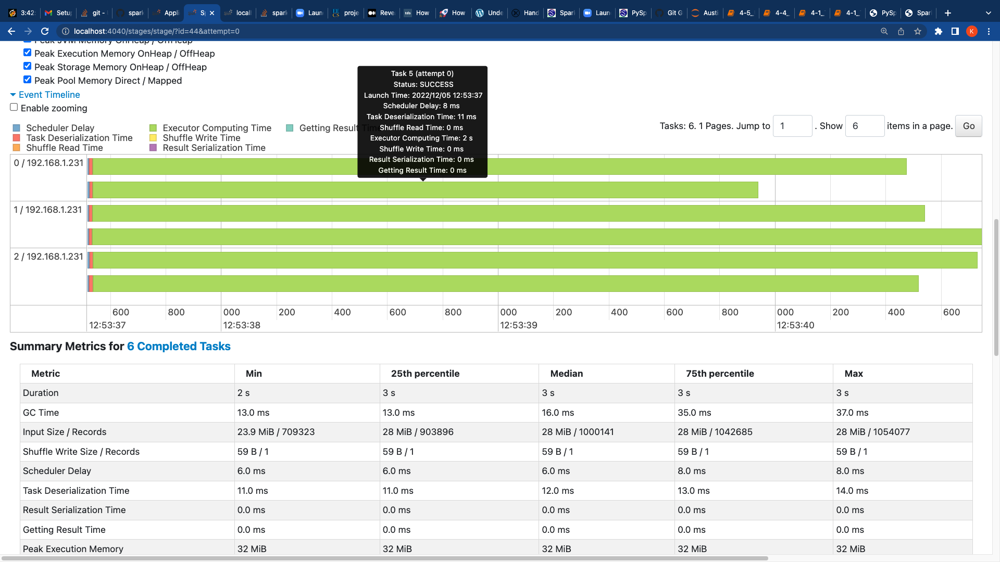

In [44]:
fo_join_lan_wiki = Lan_en_df.join(wiki_en_df, Lan_en_df.en_audience == wiki_en_df.en_audience, 'left')
fo_join_lan_wiki.show()

+-------------------+--------------------+-----------+------+---------------+-----+---+------+-------+--------+-----------+
|            Country|    Languages Spoken|en_audience|locale|           page|views| c4|Domain|project|project2|en_audience|
+-------------------+--------------------+-----------+------+---------------+-----+---+------+-------+--------+-----------+
|Antigua and Barbuda|English (official...|       true|  en.d|           myre|    1|  0|    en|      d|    null|       true|
|Antigua and Barbuda|English (official...|       true|  en.d|        mystery|    1|  0|    en|      d|    null|       true|
|Antigua and Barbuda|English (official...|       true|  en.d|       mysticus|    1|  0|    en|      d|    null|       true|
|Antigua and Barbuda|English (official...|       true|  en.d|        mystory|    1|  0|    en|      d|    null|       true|
|Antigua and Barbuda|English (official...|       true|  en.d|        mystère|    1|  0|    en|      d|    null|       true|
|Antigua

In [18]:
fo_join_lan_wiki = Lan_en_df.join(wiki_en_df, Lan_en_df.en_audience == wiki_en_df.en_audience, 'inner')
fo_join_lan_wiki.show()

+--------------------+--------------------+-----------+------+---------+-----+---+------+-------+--------+-----------+
|             Country|    Languages Spoken|en_audience|locale|     page|views| c4|Domain|project|project2|en_audience|
+--------------------+--------------------+-----------+------+---------+-----+---+------+-------+--------+-----------+
|               Yemen|              Arabic|      false|    aa|Main_Page|    3|  0|    aa|   null|    null|      false|
|Western Sahara (p...|Hassaniya Arabic,...|      false|    aa|Main_Page|    3|  0|    aa|   null|    null|      false|
|           Venezuela|Spanish (official...|      false|    aa|Main_Page|    3|  0|    aa|   null|    null|      false|
|Vatican City (Hol...|Italian, Latin, F...|      false|    aa|Main_Page|    3|  0|    aa|   null|    null|      false|
|          Uzbekistan|Uzbek 74.3%, Russ...|      false|    aa|Main_Page|    3|  0|    aa|   null|    null|      false|
|             Uruguay|Spanish, Portunol...|     

In [17]:
#Causes data skew.Missing output location for shuffle.
fo_join_lan_wiki = Lan_en_df.join(wiki_en_df, Lan_en_df.en_audience == wiki_en_df.en_audience, 'full_outer')
fo_join_lan_wiki.show()

23/01/05 09:59:32 ERROR TaskSchedulerImpl: Lost executor 2 on 192.168.1.231: Remote RPC client disassociated. Likely due to containers exceeding thresholds, or network issues. Check driver logs for WARN messages.
23/01/05 09:59:32 WARN TaskSetManager: Lost task 0.0 in stage 21.0 (TID 45) (192.168.1.231 executor 2): ExecutorLostFailure (executor 2 exited caused by one of the running tasks) Reason: Remote RPC client disassociated. Likely due to containers exceeding thresholds, or network issues. Check driver logs for WARN messages.
23/01/05 09:59:33 WARN TaskSetManager: Lost task 0.1 in stage 21.0 (TID 46) (192.168.1.231 executor 1): FetchFailed(null, shuffleId=3, mapIndex=-1, mapId=-1, reduceId=0, message=
org.apache.spark.shuffle.MetadataFetchFailedException: Missing an output location for shuffle 3 partition 0
	at org.apache.spark.MapOutputTracker$.validateStatus(MapOutputTracker.scala:1701)
	at org.apache.spark.MapOutputTracker$.$anonfun$convertMapStatuses$10(MapOutputTracker.scala:1

23/01/05 09:59:52 WARN TaskSetManager: Lost task 0.0 in stage 21.1 (TID 49) (192.168.1.231 executor 3): java.lang.OutOfMemoryError: Java heap space

23/01/05 09:59:52 ERROR TaskSchedulerImpl: Lost executor 3 on 192.168.1.231: Remote RPC client disassociated. Likely due to containers exceeding thresholds, or network issues. Check driver logs for WARN messages.
23/01/05 09:59:58 WARN TaskSetManager: Lost task 0.1 in stage 21.1 (TID 50) (192.168.1.231 executor 0): FetchFailed(null, shuffleId=3, mapIndex=-1, mapId=-1, reduceId=0, message=
org.apache.spark.shuffle.MetadataFetchFailedException: Missing an output location for shuffle 3 partition 0
	at org.apache.spark.MapOutputTracker$.validateStatus(MapOutputTracker.scala:1701)
	at org.apache.spark.MapOutputTracker$.$anonfun$convertMapStatuses$10(MapOutputTracker.scala:1648)
	at org.apache.spark.MapOutputTracker$.$anonfun$convertMapStatuses$10$adapted(MapOutputTracker.scala:1647)
	at scala.collection.Iterator.foreach(Iterator.scala:943)
	at 

23/01/05 10:00:22 WARN TaskSetManager: Lost task 0.0 in stage 21.2 (TID 53) (192.168.1.231 executor 1): java.lang.OutOfMemoryError: Java heap space
	at org.apache.spark.sql.catalyst.expressions.UnsafeRow.copy(UnsafeRow.java:491)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage5.smj_consumeFullOuterJoinRow_0$(Unknown Source)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage5.processNext(Unknown Source)
	at org.apache.spark.sql.execution.BufferedRowIterator.hasNext(BufferedRowIterator.java:43)
	at org.apache.spark.sql.execution.WholeStageCodegenExec$$anon$2.hasNext(WholeStageCodegenExec.scala:779)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$getByteArrayRdd$1(SparkPlan.scala:364)
	at org.apache.spark.sql.execution.SparkPlan$$Lambda$675/0x0000000801144fd8.apply(Unknown Source)
	at org.apache.spark.rdd.RDD.$anonfun$mapPartitionsInternal$2(RDD.scala:890)
	at org.apache.spark.rdd.RDD.$anonfun$ma

Py4JJavaError: An error occurred while calling o94.showString.
: org.apache.spark.SparkException: Job 17 cancelled 
	at org.apache.spark.scheduler.DAGScheduler.failJobAndIndependentStages(DAGScheduler.scala:2672)
	at org.apache.spark.scheduler.DAGScheduler.handleJobCancellation(DAGScheduler.scala:2554)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.doOnReceive(DAGScheduler.scala:2819)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:2802)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:2791)
	at org.apache.spark.util.EventLoop$$anon$1.run(EventLoop.scala:49)
	at org.apache.spark.scheduler.DAGScheduler.runJob(DAGScheduler.scala:952)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2228)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2249)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2268)
	at org.apache.spark.sql.execution.SparkPlan.executeTake(SparkPlan.scala:506)
	at org.apache.spark.sql.execution.SparkPlan.executeTake(SparkPlan.scala:459)
	at org.apache.spark.sql.execution.CollectLimitExec.executeCollect(limit.scala:48)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.$anonfun$executeCollect$1(AdaptiveSparkPlanExec.scala:340)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.withFinalPlanUpdate(AdaptiveSparkPlanExec.scala:368)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.executeCollect(AdaptiveSparkPlanExec.scala:340)
	at org.apache.spark.sql.Dataset.collectFromPlan(Dataset.scala:3868)
	at org.apache.spark.sql.Dataset.$anonfun$head$1(Dataset.scala:2863)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$2(Dataset.scala:3858)
	at org.apache.spark.sql.execution.QueryExecution$.withInternalError(QueryExecution.scala:510)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$1(Dataset.scala:3856)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$6(SQLExecution.scala:109)
	at org.apache.spark.sql.execution.SQLExecution$.withSQLConfPropagated(SQLExecution.scala:169)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$1(SQLExecution.scala:95)
	at org.apache.spark.sql.SparkSession.withActive(SparkSession.scala:779)
	at org.apache.spark.sql.execution.SQLExecution$.withNewExecutionId(SQLExecution.scala:64)
	at org.apache.spark.sql.Dataset.withAction(Dataset.scala:3856)
	at org.apache.spark.sql.Dataset.head(Dataset.scala:2863)
	at org.apache.spark.sql.Dataset.take(Dataset.scala:3084)
	at org.apache.spark.sql.Dataset.getRows(Dataset.scala:288)
	at org.apache.spark.sql.Dataset.showString(Dataset.scala:327)
	at java.base/jdk.internal.reflect.DirectMethodHandleAccessor.invoke(DirectMethodHandleAccessor.java:104)
	at java.base/java.lang.reflect.Method.invoke(Method.java:577)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:282)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.ClientServerConnection.waitForCommands(ClientServerConnection.java:182)
	at py4j.ClientServerConnection.run(ClientServerConnection.java:106)
	at java.base/java.lang.Thread.run(Thread.java:833)


23/01/05 10:00:27 WARN TaskSetManager: Lost task 0.1 in stage 21.2 (TID 54) (192.168.1.231 executor 0): TaskKilled (Stage cancelled)


In [41]:
from pyspark.sql.functions import broadcast
fo_join_lan_wiki = Lan_en_df.join(broadcast(wiki_en_df), Lan_en_df.en_audience == wiki_en_df.en_audience, 'full_outer')
fo_join_lan_wiki.show()

23/01/05 12:37:25 WARN HintErrorLogger: Hint (strategy=broadcast) is not supported in the query: build right for full outer join.
23/01/05 12:37:25 WARN HintErrorLogger: Hint (strategy=broadcast) is not supported in the query: build right for full outer join.


23/01/05 12:37:28 WARN HintErrorLogger: Hint (strategy=broadcast) is not supported in the query: build right for full outer join.


23/01/05 12:38:07 WARN TaskSetManager: Lost task 0.0 in stage 31.0 (TID 52) (192.168.1.231 executor 0): java.lang.OutOfMemoryError: Java heap space
	at org.apache.spark.sql.catalyst.expressions.UnsafeRow.copy(UnsafeRow.java:492)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage5.smj_consumeFullOuterJoinRow_0$(Unknown Source)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage5.processNext(Unknown Source)
	at org.apache.spark.sql.execution.BufferedRowIterator.hasNext(BufferedRowIterator.java:43)
	at org.apache.spark.sql.execution.WholeStageCodegenExec$$anon$2.hasNext(WholeStageCodegenExec.scala:779)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$getByteArrayRdd$1(SparkPlan.scala:364)
	at org.apache.spark.sql.execution.SparkPlan$$Lambda$693/0x000000080114d8d8.apply(Unknown Source)
	at org.apache.spark.rdd.RDD.$anonfun$mapPartitionsInternal$2(RDD.scala:890)
	at org.apache.spark.rdd.RDD.$anonfun$ma

23/01/05 12:38:38 ERROR TaskSchedulerImpl: Lost executor 0 on 192.168.1.231: Remote RPC client disassociated. Likely due to containers exceeding thresholds, or network issues. Check driver logs for WARN messages.
23/01/05 12:39:01 ERROR TaskSchedulerImpl: Lost executor 3 on 192.168.1.231: Remote RPC client disassociated. Likely due to containers exceeding thresholds, or network issues. Check driver logs for WARN messages.
23/01/05 12:39:01 WARN TaskSetManager: Lost task 0.1 in stage 31.0 (TID 53) (192.168.1.231 executor 3): ExecutorLostFailure (executor 3 exited caused by one of the running tasks) Reason: Remote RPC client disassociated. Likely due to containers exceeding thresholds, or network issues. Check driver logs for WARN messages.
23/01/05 12:39:02 WARN TaskSetManager: Lost task 0.2 in stage 31.0 (TID 54) (192.168.1.231 executor 5): FetchFailed(null, shuffleId=6, mapIndex=-1, mapId=-1, reduceId=0, message=
org.apache.spark.shuffle.MetadataFetchFailedException: Missing an output

Py4JJavaError: An error occurred while calling o216.showString.
: org.apache.spark.SparkException: Job 23 cancelled 
	at org.apache.spark.scheduler.DAGScheduler.failJobAndIndependentStages(DAGScheduler.scala:2672)
	at org.apache.spark.scheduler.DAGScheduler.handleJobCancellation(DAGScheduler.scala:2554)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.doOnReceive(DAGScheduler.scala:2819)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:2802)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:2791)
	at org.apache.spark.util.EventLoop$$anon$1.run(EventLoop.scala:49)
	at org.apache.spark.scheduler.DAGScheduler.runJob(DAGScheduler.scala:952)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2228)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2249)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2268)
	at org.apache.spark.sql.execution.SparkPlan.executeTake(SparkPlan.scala:506)
	at org.apache.spark.sql.execution.SparkPlan.executeTake(SparkPlan.scala:459)
	at org.apache.spark.sql.execution.CollectLimitExec.executeCollect(limit.scala:48)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.$anonfun$executeCollect$1(AdaptiveSparkPlanExec.scala:340)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.withFinalPlanUpdate(AdaptiveSparkPlanExec.scala:368)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.executeCollect(AdaptiveSparkPlanExec.scala:340)
	at org.apache.spark.sql.Dataset.collectFromPlan(Dataset.scala:3868)
	at org.apache.spark.sql.Dataset.$anonfun$head$1(Dataset.scala:2863)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$2(Dataset.scala:3858)
	at org.apache.spark.sql.execution.QueryExecution$.withInternalError(QueryExecution.scala:510)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$1(Dataset.scala:3856)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$6(SQLExecution.scala:109)
	at org.apache.spark.sql.execution.SQLExecution$.withSQLConfPropagated(SQLExecution.scala:169)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$1(SQLExecution.scala:95)
	at org.apache.spark.sql.SparkSession.withActive(SparkSession.scala:779)
	at org.apache.spark.sql.execution.SQLExecution$.withNewExecutionId(SQLExecution.scala:64)
	at org.apache.spark.sql.Dataset.withAction(Dataset.scala:3856)
	at org.apache.spark.sql.Dataset.head(Dataset.scala:2863)
	at org.apache.spark.sql.Dataset.take(Dataset.scala:3084)
	at org.apache.spark.sql.Dataset.getRows(Dataset.scala:288)
	at org.apache.spark.sql.Dataset.showString(Dataset.scala:327)
	at java.base/jdk.internal.reflect.DirectMethodHandleAccessor.invoke(DirectMethodHandleAccessor.java:104)
	at java.base/java.lang.reflect.Method.invoke(Method.java:577)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:282)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.ClientServerConnection.waitForCommands(ClientServerConnection.java:182)
	at py4j.ClientServerConnection.run(ClientServerConnection.java:106)
	at java.base/java.lang.Thread.run(Thread.java:833)


23/01/05 12:40:37 ERROR TaskSchedulerImpl: Lost executor 5 on 192.168.1.231: Remote RPC client disassociated. Likely due to containers exceeding thresholds, or network issues. Check driver logs for WARN messages.
23/01/05 12:40:37 WARN TaskSetManager: Lost task 0.0 in stage 31.1 (TID 60) (192.168.1.231 executor 5): ExecutorLostFailure (executor 5 exited caused by one of the running tasks) Reason: Remote RPC client disassociated. Likely due to containers exceeding thresholds, or network issues. Check driver logs for WARN messages.


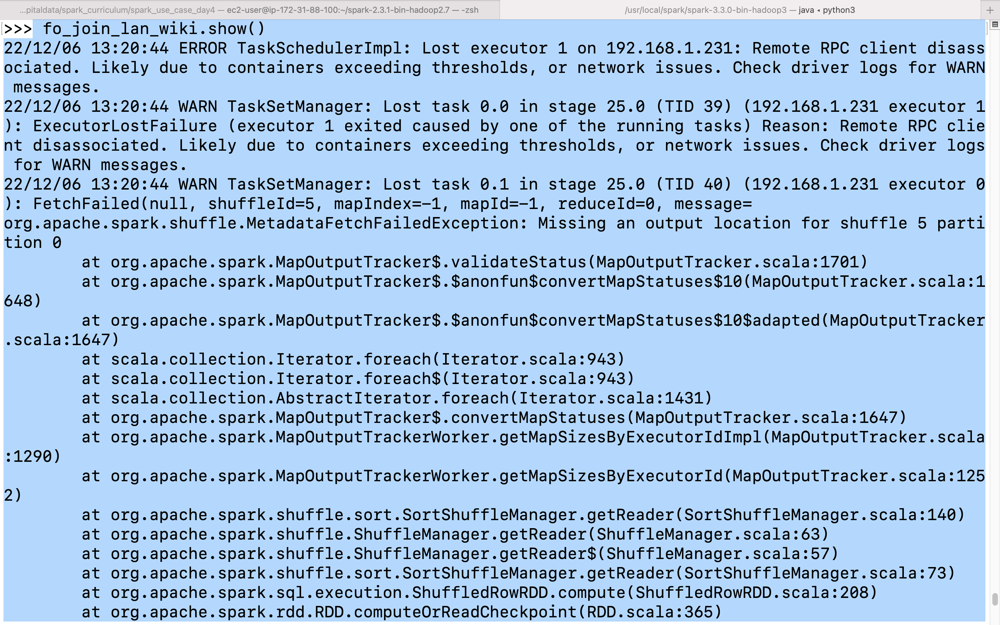

In [19]:
#Because our datasets are small, Spark will try and do a broadcast join. In order to see our skew happening, we need to suppress this behaviour
spark.conf.set("spark.sql.autoBroadcastJoinThreshold", -1)



In [20]:
skewFactor = 7
saltDF = spark.range(skewFactor).toDF("salt")
saltDF.show()

+----+
|salt|
+----+
|   0|
|   1|
|   2|
|   3|
|   4|
|   5|
|   6|
+----+



In [40]:
skewFactor =10
saltDF = spark.range(skewFactor).toDF("salt")
saltDF.show()

23/01/04 14:25:36 WARN HeartbeatReceiver: Removing executor 9 with no recent heartbeats: 171347 ms exceeds timeout 120000 ms
23/01/04 14:25:36 ERROR TaskSchedulerImpl: Lost executor 9 on 192.168.1.231: Executor heartbeat timed out after 171347 ms
23/01/04 14:25:36 WARN TaskSetManager: Lost task 0.0 in stage 69.1 (TID 250) (192.168.1.231 executor 9): ExecutorLostFailure (executor 9 exited caused by one of the running tasks) Reason: Executor heartbeat timed out after 171347 ms
23/01/04 14:25:36 WARN TaskSetManager: Lost task 0.0 in stage 70.0 (TID 251) (192.168.1.231 executor 9): ExecutorLostFailure (executor 9 exited caused by one of the running tasks) Reason: Executor heartbeat timed out after 171347 ms
+----+
|salt|
+----+
|   0|
|   1|
|   2|
|   3|
|   4|
|   5|
|   6|
|   7|
|   8|
|   9|
+----+



23/01/04 14:25:36 WARN TaskSetManager: Lost task 0.1 in stage 69.1 (TID 257) (192.168.1.231 executor 7): FetchFailed(null, shuffleId=16, mapIndex=-1, mapId=-1, reduceId=0, message=
org.apache.spark.shuffle.MetadataFetchFailedException: Missing an output location for shuffle 16 partition 0
	at org.apache.spark.MapOutputTracker$.validateStatus(MapOutputTracker.scala:1701)
	at org.apache.spark.MapOutputTracker$.$anonfun$convertMapStatuses$10(MapOutputTracker.scala:1648)
	at org.apache.spark.MapOutputTracker$.$anonfun$convertMapStatuses$10$adapted(MapOutputTracker.scala:1647)
	at scala.collection.Iterator.foreach(Iterator.scala:943)
	at scala.collection.Iterator.foreach$(Iterator.scala:943)
	at scala.collection.AbstractIterator.foreach(Iterator.scala:1431)
	at org.apache.spark.MapOutputTracker$.convertMapStatuses(MapOutputTracker.scala:1647)
	at org.apache.spark.MapOutputTrackerWorker.getMapSizesByExecutorIdImpl(MapOutputTracker.scala:1290)
	at org.apache.spark.MapOutputTrackerWorker.getMa

23/01/04 14:25:46 WARN TransportChannelHandler: Exception in connection from /192.168.1.231:53999
java.net.SocketException: Connection reset
	at java.base/sun.nio.ch.SocketChannelImpl.throwConnectionReset(SocketChannelImpl.java:394)
	at java.base/sun.nio.ch.SocketChannelImpl.read(SocketChannelImpl.java:426)
	at io.netty.buffer.PooledByteBuf.setBytes(PooledByteBuf.java:258)
	at io.netty.buffer.AbstractByteBuf.writeBytes(AbstractByteBuf.java:1132)
	at io.netty.channel.socket.nio.NioSocketChannel.doReadBytes(NioSocketChannel.java:350)
	at io.netty.channel.nio.AbstractNioByteChannel$NioByteUnsafe.read(AbstractNioByteChannel.java:151)
	at io.netty.channel.nio.NioEventLoop.processSelectedKey(NioEventLoop.java:722)
	at io.netty.channel.nio.NioEventLoop.processSelectedKeysOptimized(NioEventLoop.java:658)
	at io.netty.channel.nio.NioEventLoop.processSelectedKeys(NioEventLoop.java:584)
	at io.netty.channel.nio.NioEventLoop.run(NioEventLoop.java:496)
	at io.netty.util.concurrent.SingleThreadEvent

23/01/04 14:28:01 ERROR TaskSchedulerImpl: Lost executor 6 on 192.168.1.231: Remote RPC client disassociated. Likely due to containers exceeding thresholds, or network issues. Check driver logs for WARN messages.
23/01/04 14:28:01 WARN TaskSetManager: Lost task 0.0 in stage 69.2 (TID 261) (192.168.1.231 executor 6): ExecutorLostFailure (executor 6 exited caused by one of the running tasks) Reason: Remote RPC client disassociated. Likely due to containers exceeding thresholds, or network issues. Check driver logs for WARN messages.
23/01/04 14:28:01 WARN TaskSetManager: Lost task 0.1 in stage 69.2 (TID 262) (192.168.1.231 executor 7): FetchFailed(null, shuffleId=15, mapIndex=-1, mapId=-1, reduceId=0, message=
org.apache.spark.shuffle.MetadataFetchFailedException: Missing an output location for shuffle 15 partition 0
	at org.apache.spark.MapOutputTracker$.validateStatus(MapOutputTracker.scala:1701)
	at org.apache.spark.MapOutputTracker$.$anonfun$convertMapStatuses$10(MapOutputTracker.sca

In [21]:
from pyspark.sql.functions import concat
lan_SaltedDF = Lan_en_df.crossJoin(saltDF).withColumn("salted_skew_id", concat("en_audience", lit("-"), "salt")).drop("salt")  
lan_SaltedDF.show()

+-------------------+--------------------+-----------+--------------+
|            Country|    Languages Spoken|en_audience|salted_skew_id|
+-------------------+--------------------+-----------+--------------+
|        Afghanistan|Dari Persian, Pas...|      false|       false-0|
|            Albania|Albanian (Tosk is...|      false|       false-0|
|            Algeria|Arabic (official)...|      false|       false-0|
|            Andorra|Catalán (official...|      false|       false-0|
|             Angola|Portuguese (offic...|      false|       false-0|
|Antigua and Barbuda|English (official...|       true|        true-0|
|          Argentina|Spanish (official...|       true|        true-0|
|            Armenia|Armenian 98%, Yez...|      false|       false-0|
|          Australia|English 79%, nati...|       true|        true-0|
|            Austria|German (official ...|      false|       false-0|
|         Azerbaijan|Azerbaijani Turki...|      false|       false-0|
|            Bahamas

In [22]:
wiki_SaltedDF = wiki_en_df.crossJoin(saltDF).withColumn("salt", (lit(skewFactor) * rand()).cast("int")).withColumn("salted_skew_id", concat("en_audience", lit("-"), "salt")).drop("salt")
wiki_SaltedDF.show()

+------+--------------------+-----+---+------+-------+--------+-----------+--------------+
|locale|                page|views| c4|Domain|project|project2|en_audience|salted_skew_id|
+------+--------------------+-----+---+------+-------+--------+-----------+--------------+
|    aa|           Main_Page|    3|  0|    aa|   null|    null|      false|       false-4|
|    aa|           Main_page|    1|  0|    aa|   null|    null|      false|       false-2|
|    aa|           User:Savh|    1|  0|    aa|   null|    null|      false|       false-6|
|    aa|           Wikipedia|    1|  0|    aa|   null|    null|      false|       false-1|
|  aa.b|           User:Savh|    1|  0|    aa|      b|    null|      false|       false-3|
|  aa.d|           User:Savh|    1|  0|    aa|      d|    null|      false|       false-0|
|    ab|                1986|    1|  0|    ab|   null|    null|      false|       false-4|
|    ab|                   B|    1|  0|    ab|   null|    null|      false|       false-1|

In [23]:
#Join both salted table on “salt_id”
salted_Join_df=lan_SaltedDF.join(wiki_SaltedDF,lan_SaltedDF.salted_skew_id==wiki_SaltedDF.salted_skew_id)
salted_Join_df.show()

23/01/05 10:08:06 WARN HeartbeatReceiver: Removing executor 4 with no recent heartbeats: 156634 ms exceeds timeout 120000 ms
23/01/05 10:08:06 ERROR TaskSchedulerImpl: Lost executor 4 on 192.168.1.231: Executor heartbeat timed out after 156634 ms
23/01/05 10:08:06 WARN TaskSetManager: Lost task 0.0 in stage 33.0 (TID 147) (192.168.1.231 executor 4): ExecutorLostFailure (executor 4 exited caused by one of the running tasks) Reason: Executor heartbeat timed out after 156634 ms
23/01/05 10:08:06 WARN TaskSetManager: Lost task 0.1 in stage 33.0 (TID 148) (192.168.1.231 executor 5): FetchFailed(null, shuffleId=4, mapIndex=-1, mapId=-1, reduceId=0, message=
org.apache.spark.shuffle.MetadataFetchFailedException: Missing an output location for shuffle 4 partition 0
	at org.apache.spark.MapOutputTracker$.validateStatus(MapOutputTracker.scala:1701)
	at org.apache.spark.MapOutputTracker$.$anonfun$convertMapStatuses$10(MapOutputTracker.scala:1648)
	at org.apache.spark.MapOutputTracker$.$anonfun$co

23/01/05 10:08:16 WARN TransportChannelHandler: Exception in connection from /192.168.1.231:49845
java.net.SocketException: Connection reset
	at java.base/sun.nio.ch.SocketChannelImpl.throwConnectionReset(SocketChannelImpl.java:394)
	at java.base/sun.nio.ch.SocketChannelImpl.read(SocketChannelImpl.java:426)
	at io.netty.buffer.PooledByteBuf.setBytes(PooledByteBuf.java:258)
	at io.netty.buffer.AbstractByteBuf.writeBytes(AbstractByteBuf.java:1132)
	at io.netty.channel.socket.nio.NioSocketChannel.doReadBytes(NioSocketChannel.java:350)
	at io.netty.channel.nio.AbstractNioByteChannel$NioByteUnsafe.read(AbstractNioByteChannel.java:151)
	at io.netty.channel.nio.NioEventLoop.processSelectedKey(NioEventLoop.java:722)
	at io.netty.channel.nio.NioEventLoop.processSelectedKeysOptimized(NioEventLoop.java:658)
	at io.netty.channel.nio.NioEventLoop.processSelectedKeys(NioEventLoop.java:584)
	at io.netty.channel.nio.NioEventLoop.run(NioEventLoop.java:496)
	at io.netty.util.concurrent.SingleThreadEvent

23/01/05 10:11:06 WARN HeartbeatReceiver: Removing executor 7 with no recent heartbeats: 170532 ms exceeds timeout 120000 ms
23/01/05 10:11:06 ERROR TaskSchedulerImpl: Lost executor 7 on 192.168.1.231: Executor heartbeat timed out after 170532 ms
23/01/05 10:11:06 WARN TaskSetManager: Lost task 0.0 in stage 33.1 (TID 167) (192.168.1.231 executor 7): ExecutorLostFailure (executor 7 exited caused by one of the running tasks) Reason: Executor heartbeat timed out after 170532 ms
23/01/05 10:11:06 WARN TaskSetManager: Lost task 0.1 in stage 33.1 (TID 168) (192.168.1.231 executor 0): FetchFailed(null, shuffleId=5, mapIndex=-1, mapId=-1, reduceId=0, message=
org.apache.spark.shuffle.MetadataFetchFailedException: Missing an output location for shuffle 5 partition 0
	at org.apache.spark.MapOutputTracker$.validateStatus(MapOutputTracker.scala:1701)
	at org.apache.spark.MapOutputTracker$.$anonfun$convertMapStatuses$10(MapOutputTracker.scala:1648)
	at org.apache.spark.MapOutputTracker$.$anonfun$co

23/01/05 10:11:16 WARN TransportChannelHandler: Exception in connection from /192.168.1.231:50032
java.net.SocketException: Connection reset
	at java.base/sun.nio.ch.SocketChannelImpl.throwConnectionReset(SocketChannelImpl.java:394)
	at java.base/sun.nio.ch.SocketChannelImpl.read(SocketChannelImpl.java:426)
	at io.netty.buffer.PooledByteBuf.setBytes(PooledByteBuf.java:258)
	at io.netty.buffer.AbstractByteBuf.writeBytes(AbstractByteBuf.java:1132)
	at io.netty.channel.socket.nio.NioSocketChannel.doReadBytes(NioSocketChannel.java:350)
	at io.netty.channel.nio.AbstractNioByteChannel$NioByteUnsafe.read(AbstractNioByteChannel.java:151)
	at io.netty.channel.nio.NioEventLoop.processSelectedKey(NioEventLoop.java:722)
	at io.netty.channel.nio.NioEventLoop.processSelectedKeysOptimized(NioEventLoop.java:658)
	at io.netty.channel.nio.NioEventLoop.processSelectedKeys(NioEventLoop.java:584)
	at io.netty.channel.nio.NioEventLoop.run(NioEventLoop.java:496)
	at io.netty.util.concurrent.SingleThreadEvent

Py4JJavaError: An error occurred while calling o133.showString.
: org.apache.spark.SparkException: Job 27 cancelled 
	at org.apache.spark.scheduler.DAGScheduler.failJobAndIndependentStages(DAGScheduler.scala:2672)
	at org.apache.spark.scheduler.DAGScheduler.handleJobCancellation(DAGScheduler.scala:2554)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.doOnReceive(DAGScheduler.scala:2819)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:2802)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:2791)
	at org.apache.spark.util.EventLoop$$anon$1.run(EventLoop.scala:49)
	at org.apache.spark.scheduler.DAGScheduler.runJob(DAGScheduler.scala:952)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2228)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2249)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2268)
	at org.apache.spark.sql.execution.SparkPlan.executeTake(SparkPlan.scala:506)
	at org.apache.spark.sql.execution.SparkPlan.executeTake(SparkPlan.scala:459)
	at org.apache.spark.sql.execution.CollectLimitExec.executeCollect(limit.scala:48)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.$anonfun$executeCollect$1(AdaptiveSparkPlanExec.scala:340)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.withFinalPlanUpdate(AdaptiveSparkPlanExec.scala:368)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.executeCollect(AdaptiveSparkPlanExec.scala:340)
	at org.apache.spark.sql.Dataset.collectFromPlan(Dataset.scala:3868)
	at org.apache.spark.sql.Dataset.$anonfun$head$1(Dataset.scala:2863)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$2(Dataset.scala:3858)
	at org.apache.spark.sql.execution.QueryExecution$.withInternalError(QueryExecution.scala:510)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$1(Dataset.scala:3856)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$6(SQLExecution.scala:109)
	at org.apache.spark.sql.execution.SQLExecution$.withSQLConfPropagated(SQLExecution.scala:169)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$1(SQLExecution.scala:95)
	at org.apache.spark.sql.SparkSession.withActive(SparkSession.scala:779)
	at org.apache.spark.sql.execution.SQLExecution$.withNewExecutionId(SQLExecution.scala:64)
	at org.apache.spark.sql.Dataset.withAction(Dataset.scala:3856)
	at org.apache.spark.sql.Dataset.head(Dataset.scala:2863)
	at org.apache.spark.sql.Dataset.take(Dataset.scala:3084)
	at org.apache.spark.sql.Dataset.getRows(Dataset.scala:288)
	at org.apache.spark.sql.Dataset.showString(Dataset.scala:327)
	at java.base/jdk.internal.reflect.DirectMethodHandleAccessor.invoke(DirectMethodHandleAccessor.java:104)
	at java.base/java.lang.reflect.Method.invoke(Method.java:577)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:282)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.ClientServerConnection.waitForCommands(ClientServerConnection.java:182)
	at py4j.ClientServerConnection.run(ClientServerConnection.java:106)
	at java.base/java.lang.Thread.run(Thread.java:833)


23/01/05 10:12:18 WARN TransportChannelHandler: Exception in connection from /192.168.1.231:49869
java.net.SocketException: Connection reset
	at java.base/sun.nio.ch.SocketChannelImpl.throwConnectionReset(SocketChannelImpl.java:394)
	at java.base/sun.nio.ch.SocketChannelImpl.read(SocketChannelImpl.java:426)
	at io.netty.buffer.PooledByteBuf.setBytes(PooledByteBuf.java:258)
	at io.netty.buffer.AbstractByteBuf.writeBytes(AbstractByteBuf.java:1132)
	at io.netty.channel.socket.nio.NioSocketChannel.doReadBytes(NioSocketChannel.java:350)
	at io.netty.channel.nio.AbstractNioByteChannel$NioByteUnsafe.read(AbstractNioByteChannel.java:151)
	at io.netty.channel.nio.NioEventLoop.processSelectedKey(NioEventLoop.java:722)
	at io.netty.channel.nio.NioEventLoop.processSelectedKeysOptimized(NioEventLoop.java:658)
	at io.netty.channel.nio.NioEventLoop.processSelectedKeys(NioEventLoop.java:584)
	at io.netty.channel.nio.NioEventLoop.run(NioEventLoop.java:496)
	at io.netty.util.concurrent.SingleThreadEvent

## 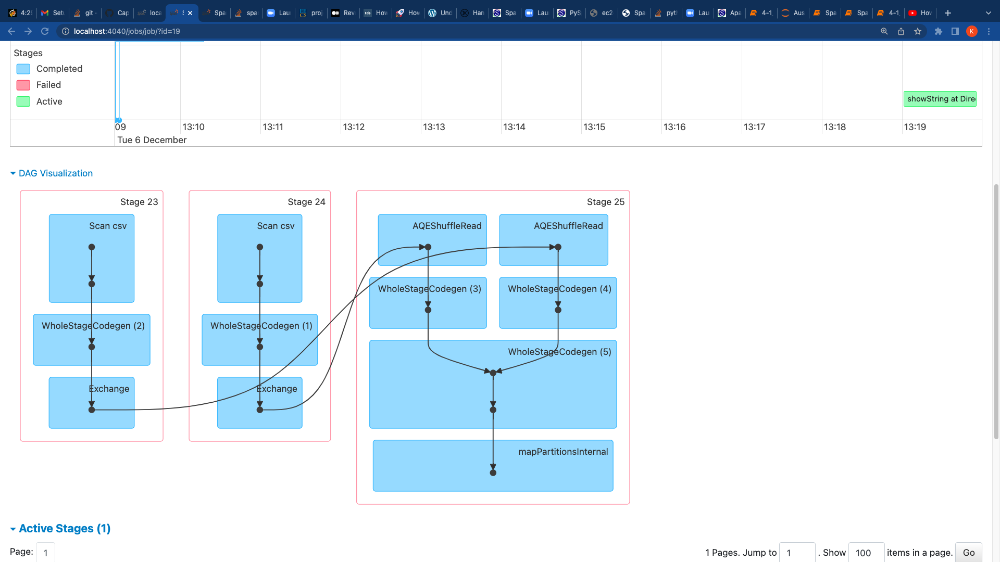

In [30]:
n = 5
salt_values = list(range(n)) 
# explode the lookup dataframe with salt
# This will generage n records for each record where n = len(salt_values)
Lan_en_df = Lan_en_df.withColumn("salt_values", array([lit(i) for i in salt_values]))
Lan_en_df_salt= Lan_en_df.withColumn("_salt_", explode(Lan_en_df.salt_values)).drop("salt_values")
Lan_en_df_salt.show()

+-----------+--------------------+-----------+------+
|    Country|    Languages Spoken|en_audience|_salt_|
+-----------+--------------------+-----------+------+
|Afghanistan|Dari Persian, Pas...|      false|     0|
|Afghanistan|Dari Persian, Pas...|      false|     1|
|Afghanistan|Dari Persian, Pas...|      false|     2|
|Afghanistan|Dari Persian, Pas...|      false|     3|
|Afghanistan|Dari Persian, Pas...|      false|     4|
|    Albania|Albanian (Tosk is...|      false|     0|
|    Albania|Albanian (Tosk is...|      false|     1|
|    Albania|Albanian (Tosk is...|      false|     2|
|    Albania|Albanian (Tosk is...|      false|     3|
|    Albania|Albanian (Tosk is...|      false|     4|
|    Algeria|Arabic (official)...|      false|     0|
|    Algeria|Arabic (official)...|      false|     1|
|    Algeria|Arabic (official)...|      false|     2|
|    Algeria|Arabic (official)...|      false|     3|
|    Algeria|Arabic (official)...|      false|     4|
|    Andorra|Catalán (offici

In [34]:
wiki_en_df_salt= wiki_en_df.withColumn("_salt_", monotonically_increasing_id() % n)
wiki_en_df_salt.show()

+------+--------------------+-----+---+------+-------+--------+-----------+------+
|locale|                page|views| c4|Domain|project|project2|en_audience|_salt_|
+------+--------------------+-----+---+------+-------+--------+-----------+------+
|    aa|           Main_Page|    3|  0|    aa|   null|    null|      false|     0|
|    aa|           Main_page|    1|  0|    aa|   null|    null|      false|     1|
|    aa|           User:Savh|    1|  0|    aa|   null|    null|      false|     2|
|    aa|           Wikipedia|    1|  0|    aa|   null|    null|      false|     3|
|  aa.b|           User:Savh|    1|  0|    aa|      b|    null|      false|     4|
|  aa.d|           User:Savh|    1|  0|    aa|      d|    null|      false|     0|
|    ab|                1986|    1|  0|    ab|   null|    null|      false|     1|
|    ab|                   B|    1|  0|    ab|   null|    null|      false|     2|
|    ab|          Авикипедиа|    1|  0|    ab|   null|    null|      false|     3|
|   

In [36]:
#join condition
join_condition = [Lan_en_df_salt.en_audience == wiki_en_df_salt.en_audience,Lan_en_df_salt._salt_ ==wiki_en_df_salt ._salt_]
df_joined = Lan_en_df_salt.join(wiki_en_df_salt, join_condition, 'left').drop("_salt_")
df_joined.show()

+-----------+--------------------+-----------+------+--------------------+-----+---+------+-------+--------+-----------+
|    Country|    Languages Spoken|en_audience|locale|                page|views| c4|Domain|project|project2|en_audience|
+-----------+--------------------+-----------+------+--------------------+-----+---+------+-------+--------+-----------+
|Afghanistan|Dari Persian, Pas...|      false|  he.m|תנועה_ערבית_להתחדשות|    1|  0|    he|      m|    null|      false|
|Afghanistan|Dari Persian, Pas...|      false|  he.m|        תנור_מיקרוגל|    1|  0|    he|      m|    null|      false|
|Afghanistan|Dari Persian, Pas...|      false|  he.m|                 תנע|    2|  0|    he|      m|    null|      false|
|Afghanistan|Dari Persian, Pas...|      false|  he.m|  תסמונת_אהלרס-דנלוס|    1|  0|    he|      m|    null|      false|
|Afghanistan|Dari Persian, Pas...|      false|  he.m|   תסמונת_גייאן-בארה|    1|  0|    he|      m|    null|      false|
|Afghanistan|Dari Persian, Pas..

In [37]:
df_joined = Lan_en_df_salt.join(wiki_en_df_salt, join_condition, 'full_outer').drop("_salt_")
df_joined.show()

23/01/05 12:27:54 WARN TaskSetManager: Lost task 0.0 in stage 19.0 (TID 30) (192.168.1.231 executor 1): java.lang.OutOfMemoryError: Java heap space
	at org.apache.spark.sql.catalyst.expressions.UnsafeRow.copy(UnsafeRow.java:492)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage5.smj_consumeFullOuterJoinRow_0$(Unknown Source)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage5.processNext(Unknown Source)
	at org.apache.spark.sql.execution.BufferedRowIterator.hasNext(BufferedRowIterator.java:43)
	at org.apache.spark.sql.execution.WholeStageCodegenExec$$anon$2.hasNext(WholeStageCodegenExec.scala:779)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$getByteArrayRdd$1(SparkPlan.scala:364)
	at org.apache.spark.sql.execution.SparkPlan$$Lambda$1075/0x00000008012ba688.apply(Unknown Source)
	at org.apache.spark.rdd.RDD.$anonfun$mapPartitionsInternal$2(RDD.scala:890)
	at org.apache.spark.rdd.RDD.$anonfun$m

Py4JJavaError: An error occurred while calling o194.showString.
: org.apache.spark.SparkException: Job 15 cancelled 
	at org.apache.spark.scheduler.DAGScheduler.failJobAndIndependentStages(DAGScheduler.scala:2672)
	at org.apache.spark.scheduler.DAGScheduler.handleJobCancellation(DAGScheduler.scala:2554)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.doOnReceive(DAGScheduler.scala:2819)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:2802)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:2791)
	at org.apache.spark.util.EventLoop$$anon$1.run(EventLoop.scala:49)
	at org.apache.spark.scheduler.DAGScheduler.runJob(DAGScheduler.scala:952)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2228)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2249)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:2268)
	at org.apache.spark.sql.execution.SparkPlan.executeTake(SparkPlan.scala:506)
	at org.apache.spark.sql.execution.SparkPlan.executeTake(SparkPlan.scala:459)
	at org.apache.spark.sql.execution.CollectLimitExec.executeCollect(limit.scala:48)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.$anonfun$executeCollect$1(AdaptiveSparkPlanExec.scala:340)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.withFinalPlanUpdate(AdaptiveSparkPlanExec.scala:368)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.executeCollect(AdaptiveSparkPlanExec.scala:340)
	at org.apache.spark.sql.Dataset.collectFromPlan(Dataset.scala:3868)
	at org.apache.spark.sql.Dataset.$anonfun$head$1(Dataset.scala:2863)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$2(Dataset.scala:3858)
	at org.apache.spark.sql.execution.QueryExecution$.withInternalError(QueryExecution.scala:510)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$1(Dataset.scala:3856)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$6(SQLExecution.scala:109)
	at org.apache.spark.sql.execution.SQLExecution$.withSQLConfPropagated(SQLExecution.scala:169)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$1(SQLExecution.scala:95)
	at org.apache.spark.sql.SparkSession.withActive(SparkSession.scala:779)
	at org.apache.spark.sql.execution.SQLExecution$.withNewExecutionId(SQLExecution.scala:64)
	at org.apache.spark.sql.Dataset.withAction(Dataset.scala:3856)
	at org.apache.spark.sql.Dataset.head(Dataset.scala:2863)
	at org.apache.spark.sql.Dataset.take(Dataset.scala:3084)
	at org.apache.spark.sql.Dataset.getRows(Dataset.scala:288)
	at org.apache.spark.sql.Dataset.showString(Dataset.scala:327)
	at java.base/jdk.internal.reflect.DirectMethodHandleAccessor.invoke(DirectMethodHandleAccessor.java:104)
	at java.base/java.lang.reflect.Method.invoke(Method.java:577)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:282)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.ClientServerConnection.waitForCommands(ClientServerConnection.java:182)
	at py4j.ClientServerConnection.run(ClientServerConnection.java:106)
	at java.base/java.lang.Thread.run(Thread.java:833)


23/01/05 12:30:14 WARN HeartbeatReceiver: Removing executor 2 with no recent heartbeats: 132767 ms exceeds timeout 120000 ms
23/01/05 12:30:14 ERROR TaskSchedulerImpl: Lost executor 2 on 192.168.1.231: Executor heartbeat timed out after 132767 ms
23/01/05 12:30:14 WARN TaskSetManager: Lost task 0.0 in stage 19.1 (TID 34) (192.168.1.231 executor 2): ExecutorLostFailure (executor 2 exited caused by one of the running tasks) Reason: Executor heartbeat timed out after 132767 ms
23/01/05 12:30:24 WARN TransportChannelHandler: Exception in connection from /192.168.1.231:51844
java.net.SocketException: Connection reset
	at java.base/sun.nio.ch.SocketChannelImpl.throwConnectionReset(SocketChannelImpl.java:394)
	at java.base/sun.nio.ch.SocketChannelImpl.read(SocketChannelImpl.java:426)
	at io.netty.buffer.PooledByteBuf.setBytes(PooledByteBuf.java:258)
	at io.netty.buffer.AbstractByteBuf.writeBytes(AbstractByteBuf.java:1132)
	at io.netty.channel.socket.nio.NioSocketChannel.doReadBytes(NioSocketC

###### Full outer join gets the same resulting count but..  much more complicated

- high skew in most task heavy stage
- 35 sec
- 208 tasks versus 7 (for inner join)

In [32]:
fo_join_lan_wiki = Lan_en_df.join(wiki_en_df, Lan_en_df.en_audience == wiki_en_df.en_audience, 'full_outer')
fo_join_lan_wiki.count()
568406100      

568406100

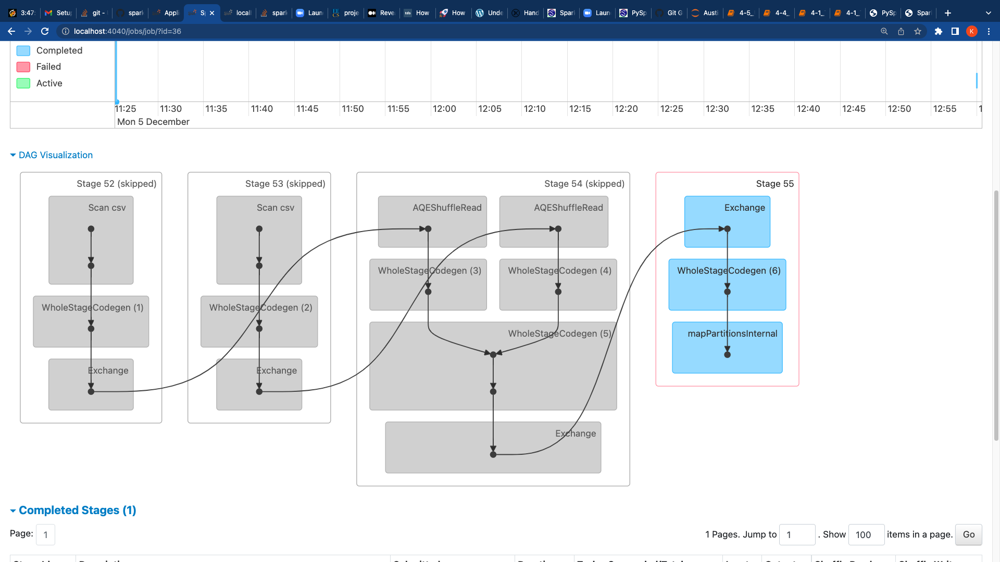

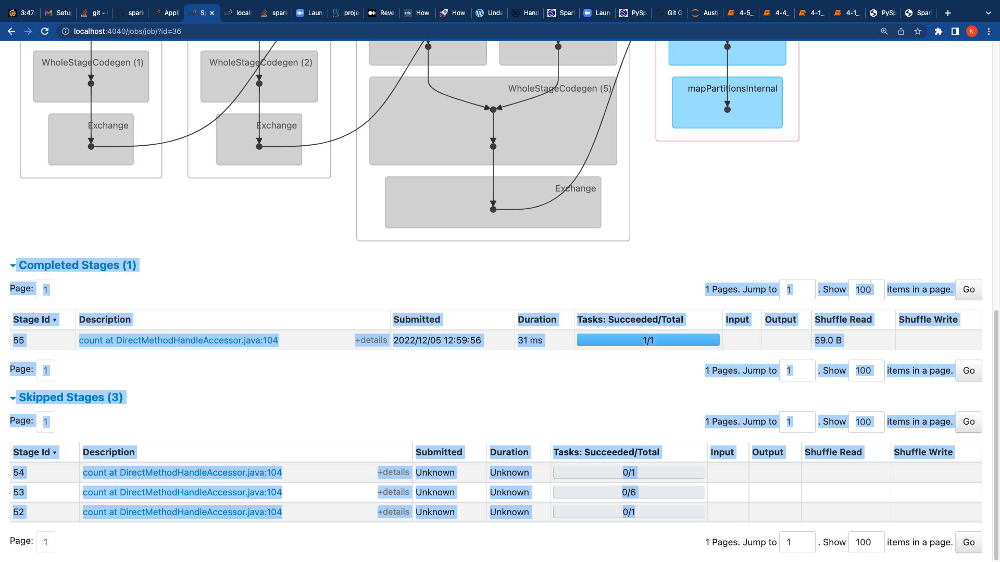

##### Cross product - this takes a while 1.2min, much fewer steps though
MUCH LESS SKEW MUCH FEWWER STEPS
limited utility (right side only)
this is large but straight forward.
1B rows for cross product (RIGHT SIDE - does not keep left side data)

    1130392890



In [ ]:
crsjoin_lan_wiki = Lan_en_df.crossJoin(wiki_en_df.select("en_audience"))
crsjoin_lan_wiki.count()
crsjoin_lan_wiki.limit(5).show()

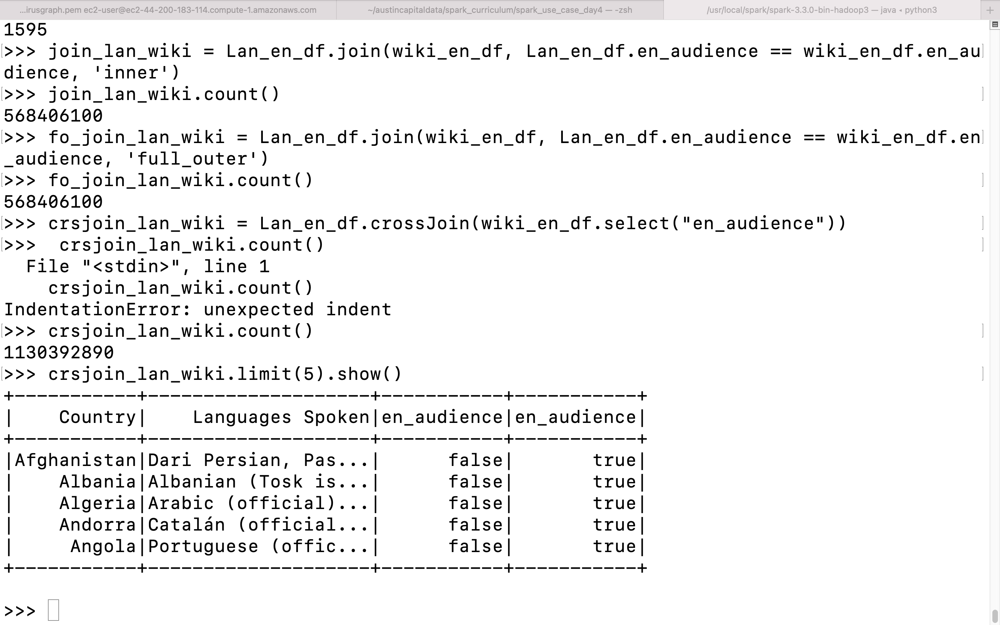

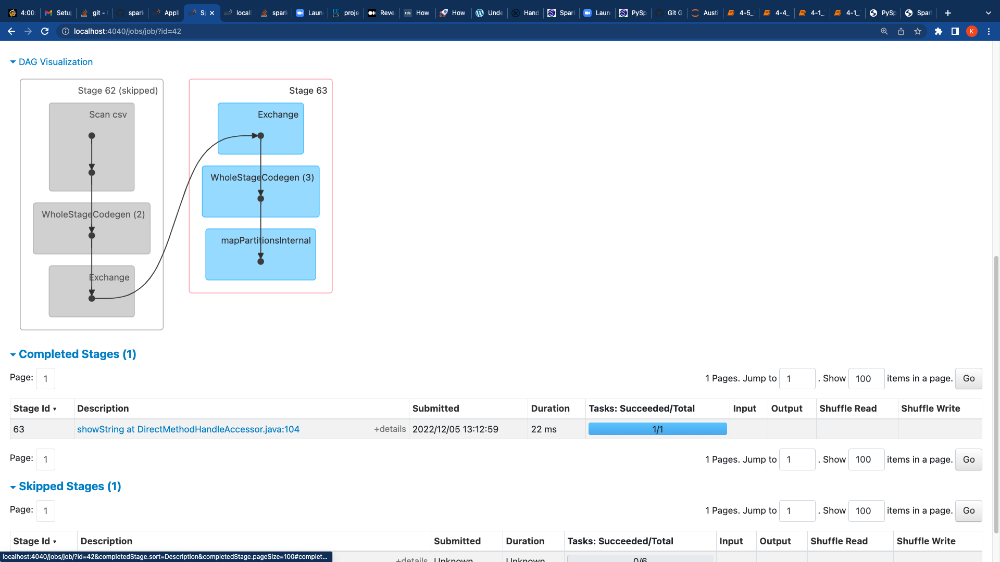

##### Now lets add in the WDI data and see if it gets worse
###### Take the skewed join and join WDI data to it 
- I would like to add in a lower call for country

jn_lan_wiki_wdi = Lan_en_df.join(wiki_en_df, Lan_en_df.en_audience == wiki_en_df.en_audience, 'full_outer')
jn_lan_wiki_wdi1 = jn_lan_wiki_wdi.join(WDIgdp_df, WDIgdp_df['Country Name'] == jn_lan_wiki_wdi.Country)
jn_lan_wiki_wdi2 = jn_lan_wiki_wdi1.join(WDIpop_df, WDIpop_df['Country Name'] == jn_lan_wiki_wdi.Country)


jn_lan_wiki_wdi = Lan_en_df.join(wiki_en_df, Lan_en_df.en_audience == wiki_en_df.en_audience)
jn_lan_wiki_wdi1 = jn_lan_wiki_wdi.join(WDIgdp_df, WDIgdp_df['Country Name'] == jn_lan_wiki_wdi.Country)
jn_lan_wiki_wdi2 = jn_lan_wiki_wdi1.join(WDIpop_df, WDIpop_df['Country Name'] == jn_lan_wiki_wdi.Country)


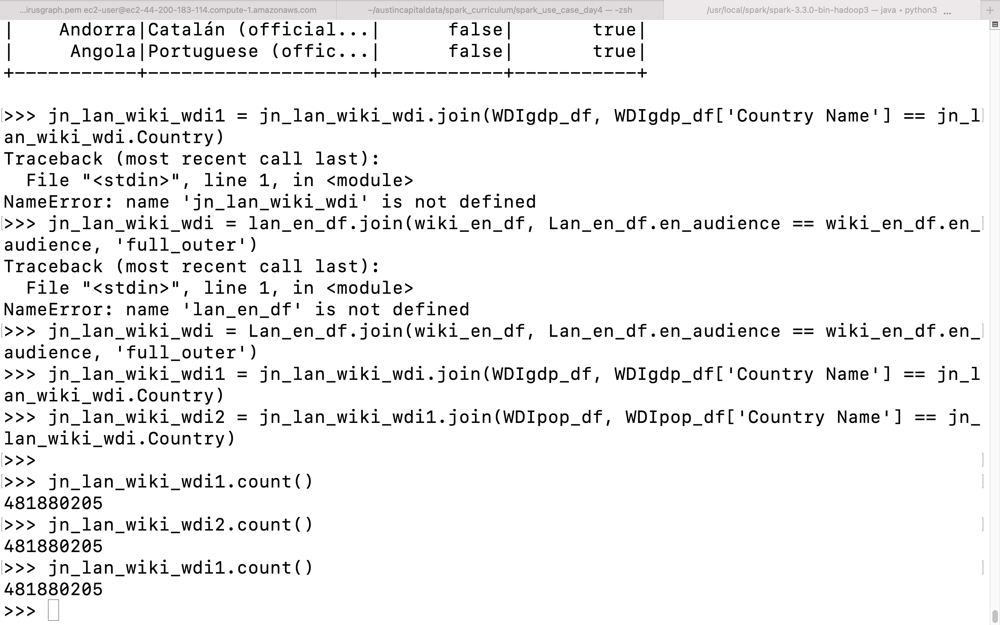

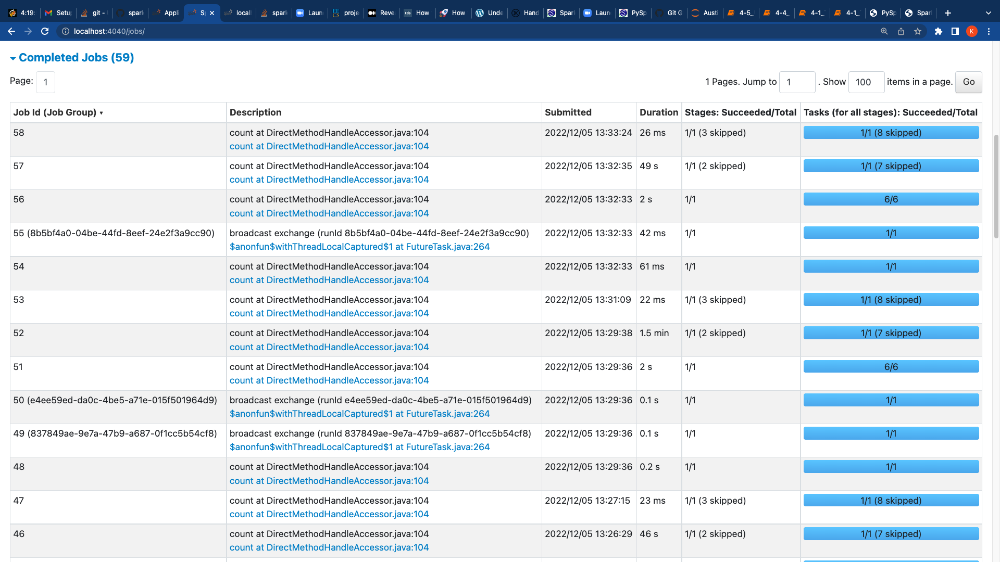

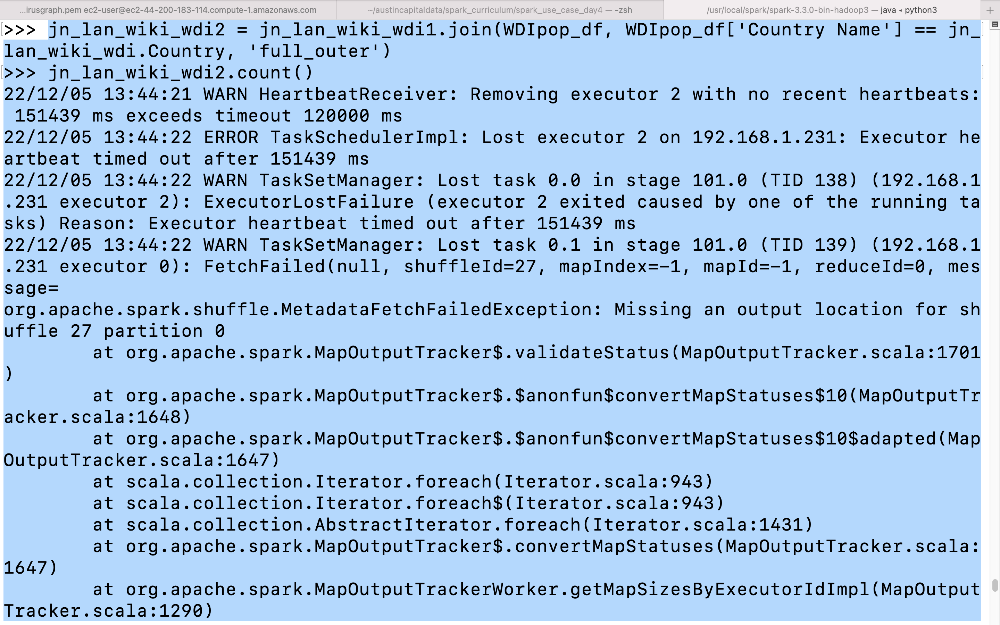

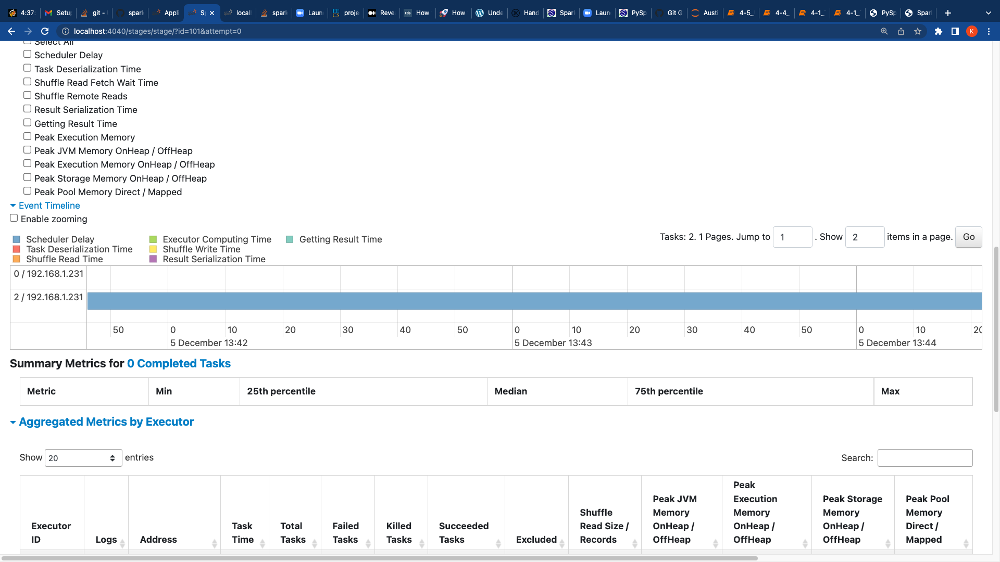

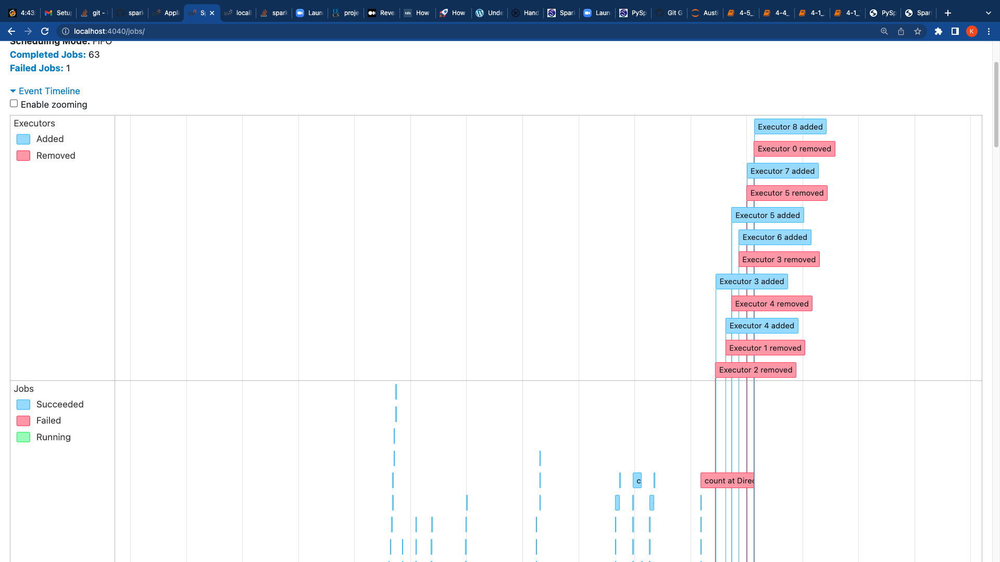

###### Failed Job due to data skewing and use of joins.

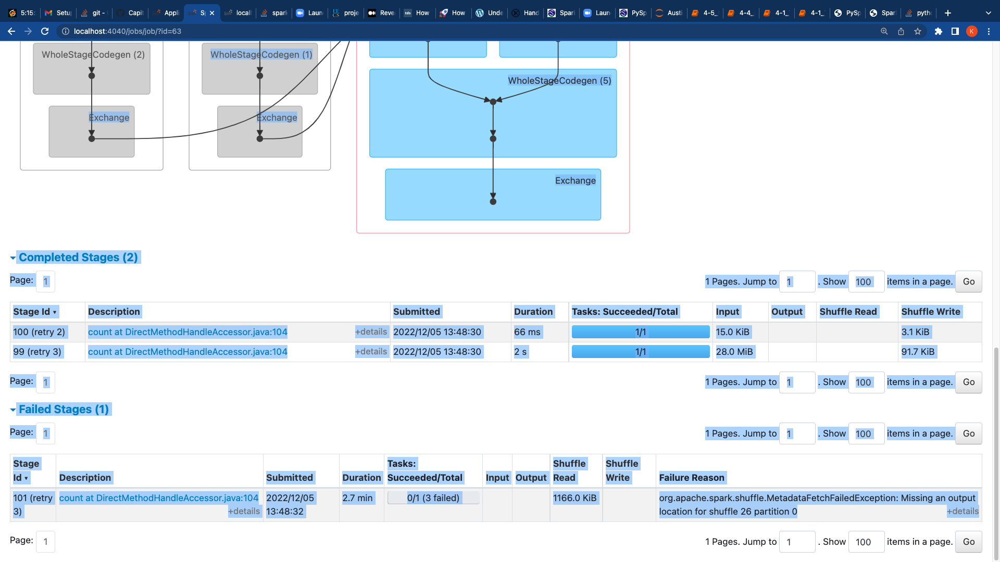

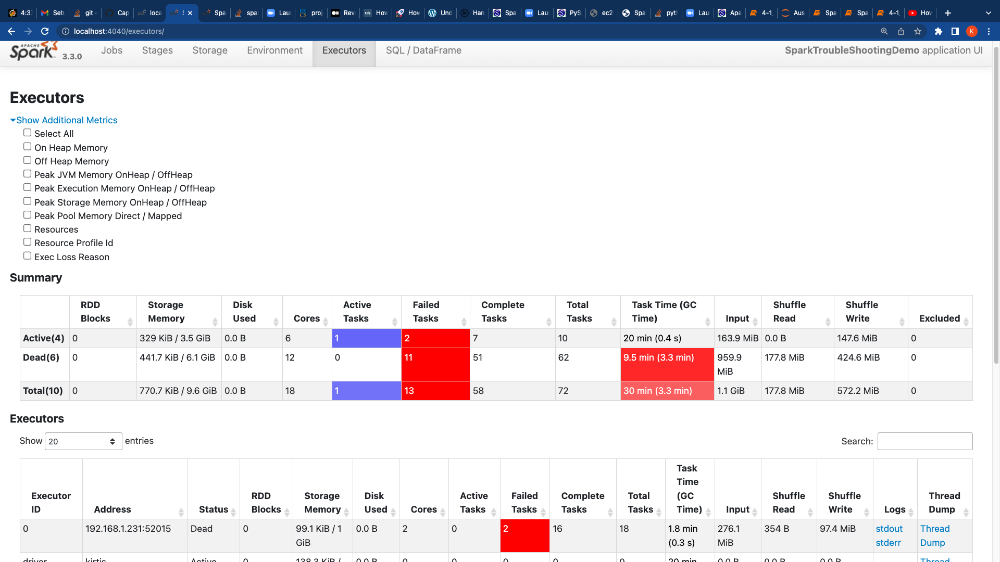

##### Summary due to the join of skewed data , performance of executors delayed and that executor stopped working .Missing output location for shuffle operation.Overcome this problem with the use of broadcast. 

In [ ]:
from pyspark.sql.functions import broadcast
jn_lan_wiki_wdi = Lan_en_df.join(broadcast(wiki_en_df), Lan_en_df.en_audience == wiki_en_df.en_audience, 'full_outer')
jn_lan_wiki_wdi1 = jn_lan_wiki_wdi.join(broadcast(WDIgdp_df), WDIgdp_df['Country Name'] == jn_lan_wiki_wdi.Country)
jn_lan_wiki_wdi2 = jn_lan_wiki_wdi1.join(broadcast(WDIpop_df), WDIpop_df['Country Name'] == jn_lan_wiki_wdi.Country)

In [ ]:
>>> jn_lan_wiki_wdi2.count()
22/12/05 14:16:34 WARN MemoryStore: Not enough space to cache broadcast_149 in memory! (computed 518.0 MiB so far)
22/12/05 14:16:34 WARN BlockManager: Persisting block broadcast_149 to disk instead.
481880205                                                                       
>>> 


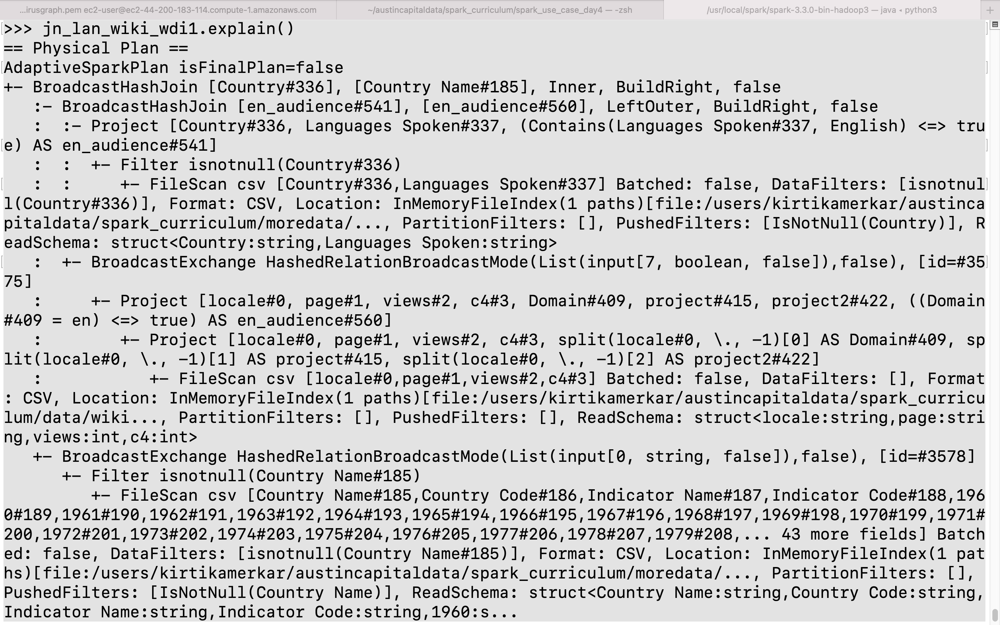

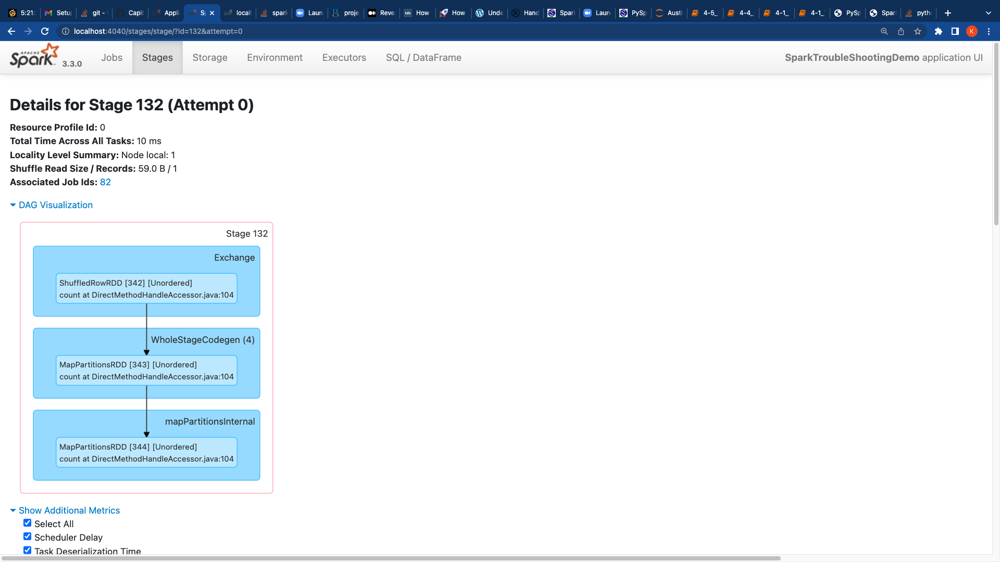

#### 4.5 User Defined Functions (UDFs)
- Issues with un-vectorized UDFs
- Remediation by vectorizing UDFs
- Demonstration and exercise


##### What Are UDFs?
UDFs stand for User Defined Functions, they are custom functions that can be written to work with Spark SQL and Spark DataFrames. They can package complex operations into a single function. This can accomplish transforamtions that would be impossible to accomplish in base spark and they will be available to use multiple times with a single call.

##### Disclaimer on UDFs
We should view UDFs as a "last resort" rather than a "first choice".

There are more and less performant ways to write them (which we will cover), but if it can be written in native spark functions, that's always going to be the better option.

Even when you make them more performant, they will still be a "black box" to Spark's optimizer. The UDFs will be used in inefficient ways and will be unable to use optimizations like "Predicate Pushdown"

##### UDF Example Exercises and demostration:
- We'll go through a few example exercises of varying complexity comparing the same transformation done with UDFs, pandas UDFs, and (when available) native spark functions.

- You'll notice that the pandas UDFs are faster than the plain UDFs and are easier to write and interpret in many cases. Neither one is as performant as the pyspark native functions.

##### Example 1 (Log)
- In this example, we are taking the natural log of the page views and returning them to a new column. This is easy to implement in the various types of UDF. There's also a PySpark built in function that handles it so we can see the performance hit that comes from using the udfs.

- We would want to do this if we were going to run machine learning on this dataset. We know that many pages will have only a few page views while a few pages will have many many page views. Taking the log makes the data more tractable and reduces the influence of the outlier points.

##### Native natural log function
- This example just shows the native spark performance on the logging task. The documentation for this function is shown on the spark website.

- Notice that we are selecting the maximum value out of the views before stopping our timer. This is because of spark's lazy execution. We need some function that goes over the whole column to get an accurate measure for how long it takes spark to do the job. If we just collected the first 10 rows for example, spark would only calculate the log for those rows. In that case, we wouldn't know how long it takes spark to operate on the whole data set.

In [ ]:
## Spark SQL Native

start_t = time()
wiki_df_fixed = wiki_df.withColumn('views_log',sql_log(col('views')))
wiki_df_fixed.select(sql_max(col('views_log'))).show()
end_t = time()

print(f"{end_t - start_t} seconds for native conversion")

+------------------+
|    max(views_log)|
+------------------+
|12.864693079020519|
+------------------+

0.40429139137268066 seconds for native conversion

##### Row-wise "basic" UDF natural log transformation
- This example demonstrates the basic use of a UDF. The udf() function needs 2 arguments, the function to be applied, and the return type of the functional output. In this case, we just want to apply the math.log function to each input in the views column. We can pass it directly. Since we are going to have decimal output, we pass the DoubleType for the return value. We imported all of the pyspark types at the top of the notebook with the line from pyspark.sql.types import *.

- For those wanting a little more depth, the pyspark documentation has all of the spark data types (link) and detailed documentation for the udf function (link).

- We've defined the UDF in the more traditoinal explicit functional way here rather than the "@ decorator notation". We do this because we are just passing in existing math.log fucnction. There's no need to do an explicit def call here, which is where you would put the @ decorator.

In [ ]:
## Spark UDF Row-wise

udf_log = udf(math.log, returnType=DoubleType())

start_t = time()
wiki_df_fixed = wiki_df.withColumn('views_log',udf_log('views'))
wiki_df_fixed.select(sql_max(col('views_log'))).show()
end_t = time()

print(f"{end_t - start_t} seconds for udf conversion")

+------------------+
|    max(views_log)|
+------------------+
|12.864693079020519|
+------------------+

4.0114426612854 seconds for udf conversion

#####  Pandas vectorized UDF natural log transformation 

The cell below shows the basic use of the pandas vectorized UDF. The `pandas_udf()` function 
needs 3 arguments, 
the function to be applied, the return type, and the (pandas udf) function type.

**Function to be applied**

The specific inputs and outputs of function to be applied is going to be determined based on the 
function type (which we'll get into a little later). In this case, we're dealing with scalar 
transformations that need to be applied to every element of the data frame, so the function that 
we pass needs to accept one or more pandas series and return single pandas series of the same size. 

The different function specifications required for the different pandas udf function types are 
shown in [the documentation](https://spark.apache.org/docs/2.4.8/api/python/pyspark.sql.html#pyspark.sql.functions.pandas_udf).

**Return Type**

This is the exact same as the non-vectorized udf. You just need to specify that the output
will be a double type. We can either explicitly use the `DoubleType()` argument as we did
there, or we can pass in the cannonical string equivalent as shown here.

**Function Type** 

There are 3 possible function types that can be used here: `SCALAR`, `GROUPED_MAP`, and `GROUPED_AGG`.

`SCALAR` is used when making transformations within a row. For example, adding the value 
for column a within a given row to the value for column b within that row. Another example
would be doing a simple transform of a column's value like we are doing here. 

`GROUPED_MAP` is used when the pandas_udf will be doing aggregation tasks within a group. 
For example, if we wanted to calculate calculate the difference between each page's views
and the minimum views that any page has within a given locale. 

The output from this type of function can cause the dataframe to shrink or grow. For example, 
it could be used to find the difference between the max and min page views for a given locale
and transform the input dataframe into one where each locale is a single row. (_though if you 
want to do that, you should reallly use the `GROUPED_AGG`)

`GROUPED_AGG` is used when making many to one group transformations. For example, taking the IQR
of views for each locale in the data frame that we're working with. 
 
*The full`pandas_udf` documentation can be found here ([link](https://spark.apache.org/docs/2.4.8/api/python/pyspark.sql.html#pyspark.sql.functions.pandas_udf)).*

In [ ]:
## Spark UDF Pandas vectorized

@pandas_udf('double',PandasUDFType.SCALAR)
def udf_pd_log(x):
    return x.apply(math.log)

## This is equivalent to the one above
# udf_pd_log = pandas_udf(lambda x: x.apply(math.log),
#                                 returnType=DoubleType(), 
#                                 functionType=PandasUDFType.SCALAR)

start_t = time()
wiki_df_fixed = wiki_df.withColumn('views_log',udf_pd_log('views'))
wiki_df_fixed.select(sql_max(col('views_log'))).show()
end_t = time()

print(f"{end_t - start_t} seconds for pandas udf conversion")


# spark.getConf.getAll()


+------------------+
|    max(views_log)|
+------------------+
|12.864693079020519|
+------------------+

2.3611371517181396 seconds for pandas udf conversion

##### Quick verification

We just verify real quick that the answer coming out of our spark job is reasonable.
Analyzing the intermediate steps is difficult in spark, so it pays to just do some 
quick gut checks. From our brief analysis, we know that the page with the highest 
views had something like 380,000 views. We can see that $e^{12 86}= 384615$ . Therefore we know
that our outputs are reasonable.

In [14]:
math.exp(12.86)

384615.72579367505

##### Demonstration of the impact of data format

This slide follows up on the discussion earlier about using parquet data instead of 
text. The functions below are exact replicas of the ones above. The difference is that
these ones are using a dataframe which references the text data. We can see that 
there is a significant performance impace associated with using text data which is 
comparable to the performance impact of using udfs instead of the spark native functions.

In [17]:
## Spark SQL Native

start_t = time()
wiki_txt_df_fixed = wiki_df.withColumn('views_log',sql_log(col('views')))
wiki_txt_df_fixed.select(sql_max(col('views_log'))).show()
end_t = time()

print(f"{end_t - start_t} seconds for native conversion")


## Spark UDF Row-wise

udf_log = udf(lambda x : math.log(x),
                      returnType=DoubleType())

start_t = time()
wiki_txt_df_fixed = wiki_df.withColumn('views_log',udf_log('views'))
wiki_txt_df_fixed.select(sql_max(col('views_log'))).show()
end_t = time()

print(f"{end_t - start_t} seconds for udf conversion")


## Spark UDF Pandas vectorized

@pandas_udf('double',PandasUDFType.SCALAR)
def udf_pd_log(x):
    return x.apply(math.log)

start_t = time()
wiki_txt_df_fixed = wiki_df.withColumn('views_log',udf_pd_log('views'))
wiki_txt_df_fixed.select(sql_max(col('views_log'))).show()
end_t = time()

print(f"{end_t - start_t} seconds for pandas udf conversion")

+------------------+
|    max(views_log)|
+------------------+
|12.864693079020519|
+------------------+

2.157238006591797 seconds for native conversion


/opt/anaconda3/lib/python3.9/site-packages/pyspark/sql/pandas/functions.py:394: UserWarning: In Python 3.6+ and Spark 3.0+, it is preferred to specify type hints for pandas UDF instead of specifying pandas UDF type which will be deprecated in the future releases. See SPARK-28264 for more details.
  warnings.warn(


+------------------+
|    max(views_log)|
+------------------+
|12.864693079020519|
+------------------+

7.535521984100342 seconds for udf conversion


+------------------+
|    max(views_log)|
+------------------+
|12.864693079020519|
+------------------+

4.509521961212158 seconds for pandas udf conversion


##### Exercise:
- ##### Task 1:Spin the 3 Workers with two cores and 1 Master Node with executor memory 2g.Examine the SparkWebUI at localhost 4040.
- ##### Task 2:Spin the 3 workers with two cores and 1 Master Node with executor memory 1g.Examine the SparkWebUI.Examine the SparkWebUI at localhost 4040.
- ##### Task 3:Spin the 12 workers with 6 cores and 1 Master Node with executor memory 1g.Examine the SparkWebUI at localhost 4040.
- ##### Task 4: Examine how does optimization build reduces read and how to recover it with pushdown and projection filter. Use Task 1 configuration and Start pyspark.Splin the 'wikipage.txt' data from data folder.Apply filter to check views field greater than equal to 5000.Examine the logical and physical plan.
- ##### Task 5:Repeat the above task changing cast of views to StrigType().
- ##### Task 6:Examine shuffling performance.
   - Use wikipedia page views set (spark-labs-python/data/wiki-pageviews.txt).(already loaded)
   -  As a refresher for our data set, the column types and first rows sorted by number of page views are presented below.

   - Load WDIpop_df = spark.read.csv("../moredata/WDI_world.pop.csv", sep = ',', header = True)
   - Load WDIgdp_df = spark.read.csv("../moredata/WDI_world.gdp.csv", sep = ',', header = True)
   - Load lang_df = spark.read.csv("../moredata/countries-languages.csv", sep = ',', header = True)
   - Find the avarage of views for each locale.Use groupBy and avg() and view the sparkUI to examine shuffling occured or not.
   - Examine the issues with shuffling like Data skew and overcome this with using broadcast and saltedJoin().Perform operation to find who are the audience for english speaking countries (english language audience)
     - fi_join_lan_wiki = Lan_en_df.join(wiki_en_df, Lan_en_df.en_audience == wiki_en_df.en_audience, 'inner')
     - fi-join-lan_wiki.count()
     - fo_join_lan_wiki = Lan_en_df.join(wiki_en_df, Lan_en_df.en_audience == wiki_en_df.en_audience, 'full_outer')
     - fo-join-lan_wiki.count()
   - Use Inner join and full outer join and examine the performance.
- ##### Task 7:Examine the UDF issues and how to remediate using vectorizing UDFs.
    - We'll go through a few example exercises of varying complexity comparing the same transformation done with UDFs, pandas UDFs, and (when available) native spark functions.

   - You'll notice that the pandas UDFs are faster than the plain UDFs and are easier to write and interpret in many cases. Neither one is as performant as the pyspark native functions.
   - Use wiki_pageviews.txt
   - Write a UDF that takes the wikipedia data and returns the locale,along with a column representing the interquartile range (IQR) of the views for that column.
   - Examine spark api performance
  

[See the PySpark Documentation for reference while building your function](https://spark.apache.org/docs/2.4.8/api/python/pyspark.sql.html#pyspark.sql.functions.pandas_udf)
   


------+--------------------+------+---+
|locale|                page| views| c4|
+------+--------------------+------+---+
|  en.m|           Main_Page|386425|  0|
|    en|           Main_Page|248511|  0|
|  de.m|Wikipedia:Hauptseite| 92347|  0|
|  it.m|      Imma_Battaglia| 89964|  0|
|    en|      Special:Search| 69630|  0|
|  fr.m|Wikipédia:Accueil...| 60361|  0|
|    en|                Rice| 47233|  0|
|  it.m|   Pagina_principale| 38624|  0|
|    en|             404.php| 34859|  0|
|  es.m|   Wikipedia:Portada| 34792|  0|
+------+--------------------+------+---+

In [ ]:
 # Skeleton for UDF task.

@pandas_udf(returnType=___, functionType=___)
def pandas_iqr(x):
    return some_function_stuff(x)

start_t = time()
wiki_df.groupby('locale').agg(
    pandas_iqr(col('views')).alias('iqr_views')
).show(10)
end_t = time()

print(f"{end_t - start_t} seconds for pandas udf conversion")

In [ ]:
# Solution

@pandas_udf(returnType=DoubleType(), functionType=PandasUDFType.GROUPED_AGG)
def pandas_iqr(s):
    return np.percentile(s,75) - np.percentile(s,25)

start_t = time()
wiki_df.groupby('locale').agg(
    pandas_iqr(col('views')).alias('iqr_views')
).sort(
    'iqr_views', 
    ascending = False
).show(10)
end_t = time()

print(f"{end_t - start_t} seconds for pandas udf conversion")

##### References:
- https://docs.databricks.com/clusters/debugging-spark-ui.html
- https://docs.qubole.com/en/latest/troubleshooting-guide/spark-ts/troubleshoot-spark.html
- https://confluence.atlassian.com/confkb/how-to-analyze-thread-dumps-788039144.html
- https://www.unraveldata.com/resources/spark-troubleshooting-part-1-ten-challenges/
- https://www.projectpro.io/recipes/what-is-dag-apache-spark#:~:text=Spark%20DAG%20is%20the%20strict,on%20detail%20on%20any%20stage.
- https://engineering.dynatrace.com/blog/optimizing-spark-queries-with-filter-pushdown/

In [1]:
!jupyter nbconvert --to webpdf --allow-chromium-download 4-1_Troubleshootingspark_final.ipynb


[NbConvertApp] Converting notebook 4-1_Troubleshootingspark_final.ipynb to webpdf
[NbConvertApp] Building PDF
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 7770362 bytes to 4-1_Troubleshootingspark_final.pdf
